In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):

    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():

    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

In [2]:
class Generator(nn.Module): 
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.relu = nn.ReLU()
        self.tanh = nn.Tanh()
        self.conv1 = nn.ConvTranspose2d(in_channels = z_dim,out_channels = hidden_dim * 4,
                           kernel_size = 3, stride = 2)
        self.b_norm1 = nn.BatchNorm2d(hidden_dim * 4)
        
        self.conv2 = nn.ConvTranspose2d(in_channels = hidden_dim * 4,out_channels = hidden_dim * 2,
                           kernel_size = 4, stride = 1)
        self.b_norm2 = nn.BatchNorm2d(hidden_dim * 2)
        
        self.conv3 = nn.ConvTranspose2d(in_channels = hidden_dim * 2,out_channels = hidden_dim,
                           kernel_size = 3, stride = 2)
        self.b_norm3 = nn.BatchNorm2d(hidden_dim)
        
        self.conv_out = nn.ConvTranspose2d(in_channels = hidden_dim,out_channels = im_chan,
                        kernel_size = 4, stride = 2)

    def unsqueeze_noise(self, noise):
        
        return noise.view(len(noise), self.z_dim, 1, 1)

    def forward(self, noise):
        #import pdb;pdb.set_trace()
        x = self.unsqueeze_noise(noise)
        intermediate1 = self.relu(self.b_norm1(self.conv1(x)))
        intermediate2 = self.relu(self.b_norm2(self.conv2(intermediate1)))
        intermediate3 = self.relu(self.b_norm3(self.conv3(intermediate2)))
        out = self.tanh(self.conv_out(intermediate3))
        return out

In [3]:
def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples, z_dim, device=device)

In [4]:
class Critic(nn.Module):
    def __init__(self, im_chan=1, hidden_dim=16):
        super(Critic, self).__init__()
        self.l_relu = nn.LeakyReLU(0.2)
        
        self.conv1 = nn.Conv2d(im_chan,hidden_dim,kernel_size = 4,stride = 2)
        self.b_norm1 = nn.BatchNorm2d(hidden_dim)
        
        self.conv2 = nn.Conv2d(hidden_dim,hidden_dim*2,kernel_size = 4,stride = 2)
        self.b_norm2 = nn.BatchNorm2d(hidden_dim*2)

        self.conv_out = nn.Conv2d(hidden_dim*2,1,kernel_size = 4,stride = 2)
        
    def forward(self, image):
        #import pdb;pdb.set_trace()
        intermediate1 = self.l_relu(self.b_norm1(self.conv1(image)))
        intermediate2 = self.l_relu(self.b_norm2(self.conv2(intermediate1)))
        out = self.conv_out(intermediate2)
        return out.view(len(out), -1)

In [5]:
n_epochs = 100
z_dim = 64
display_step = 50
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

In [6]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)

In [7]:
def get_gradient(crit, real, fake, epsilon):

    mixed_images = real * epsilon + fake * (1 - epsilon)

    mixed_scores = crit(mixed_images)
    
    gradient = torch.autograd.grad(

        inputs=mixed_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [8]:
def gradient_penalty(gradient):

    gradient = gradient.view(len(gradient), -1)

    gradient_norm = gradient.norm(2, dim=1)

    penalty = torch.mean((gradient_norm-1)**2)
    return penalty

In [9]:
def get_gen_loss(crit_fake_pred):
    gen_loss = -torch.mean(crit_fake_pred)
    return gen_loss

In [10]:
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    crit_loss = torch.mean(crit_fake_pred) - torch.mean(crit_real_pred) + c_lambda*gp
    return crit_loss

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50: Generator loss: -0.26649970828089864, critic loss: 3.879937099933626


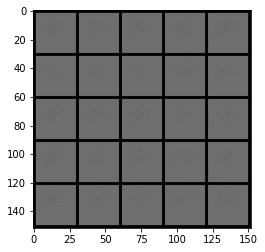

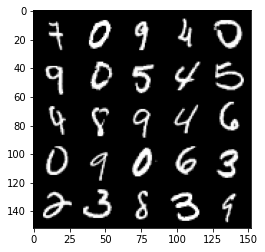

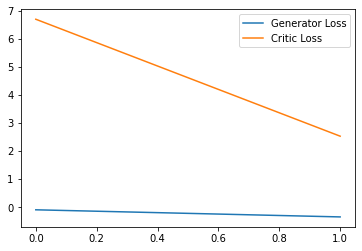

Step 100: Generator loss: -0.4815505373477936, critic loss: 1.3933770520687103


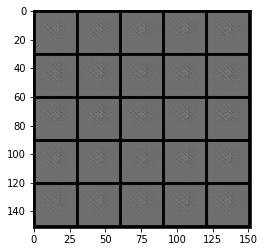

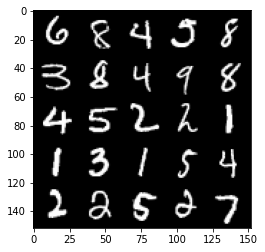

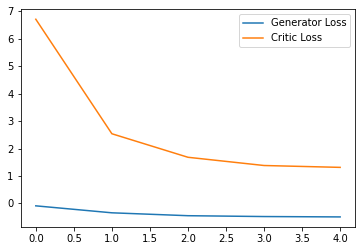

Step 150: Generator loss: -0.36864855349063874, critic loss: 0.752612778544426


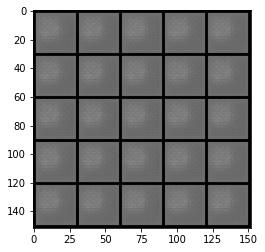

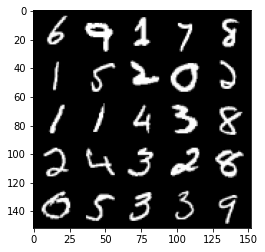

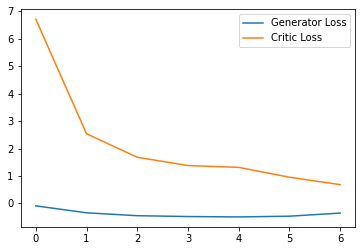

Step 200: Generator loss: -0.14949247270822524, critic loss: 0.31926174128055584


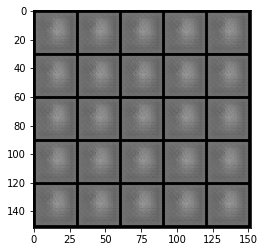

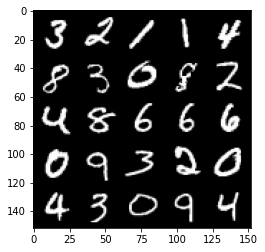

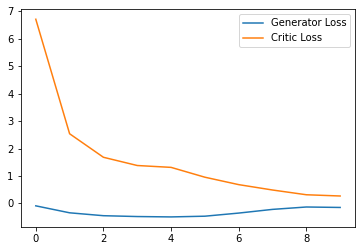

Step 250: Generator loss: -0.0880230439954903, critic loss: 0.16511547276377678


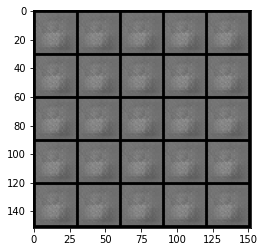

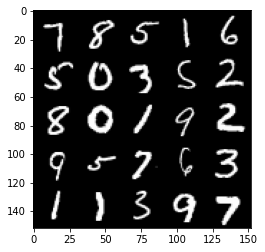

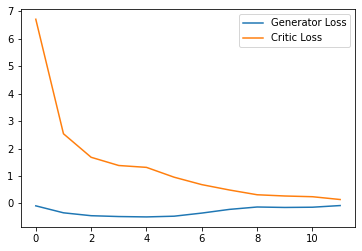

Step 300: Generator loss: 0.07291778143495321, critic loss: -0.09443072947859762


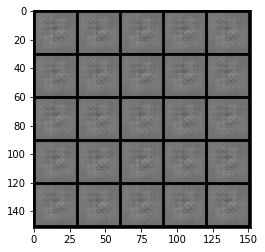

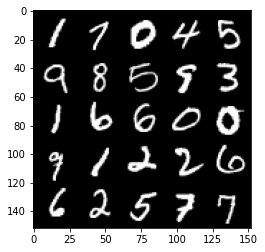

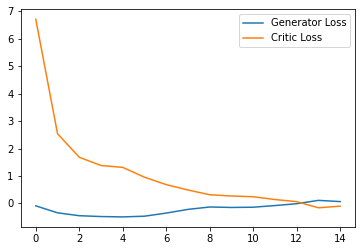

Step 350: Generator loss: 0.36505643362179396, critic loss: -0.8637887476384638


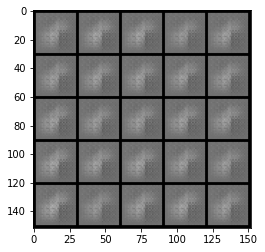

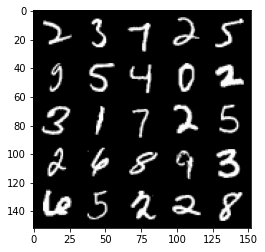

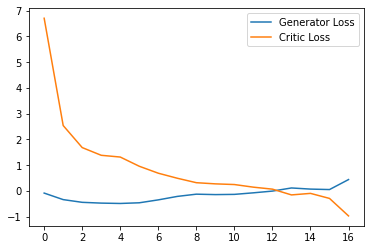

Step 400: Generator loss: 1.0394327250123023, critic loss: -3.6212280597686775


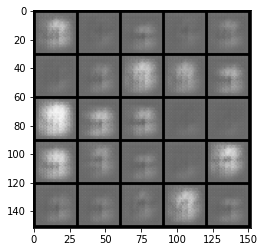

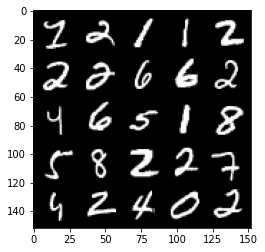

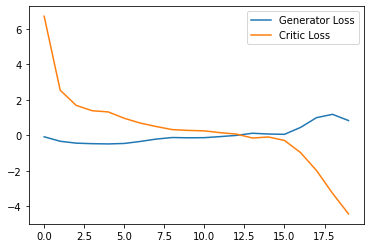

Step 450: Generator loss: 1.2896144351363181, critic loss: -8.080029356002807


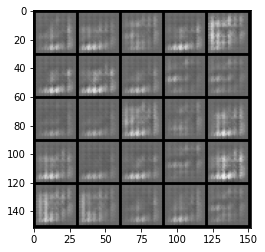

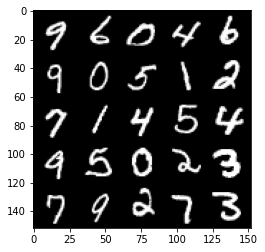

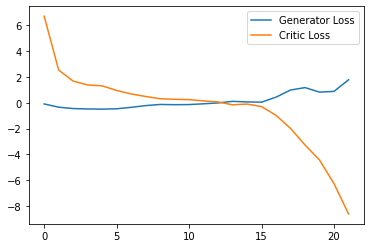

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: -0.12389152362942696, critic loss: -11.58546825218201


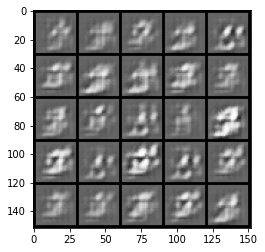

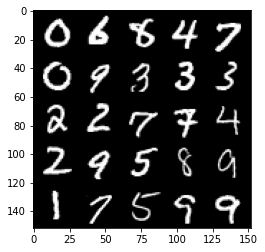

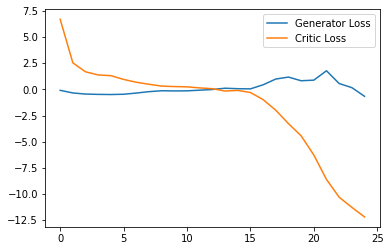

Step 550: Generator loss: 0.6312293218076229, critic loss: -17.071863684654232


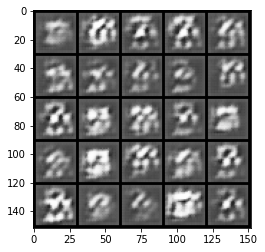

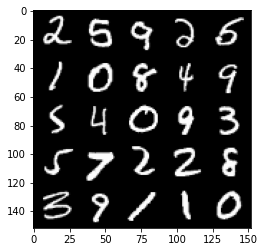

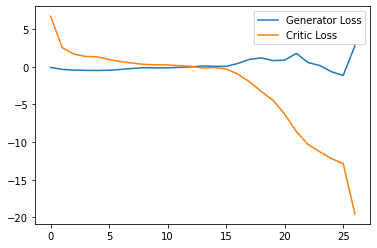

Step 600: Generator loss: -1.8808739152550698, critic loss: -21.507902423858646


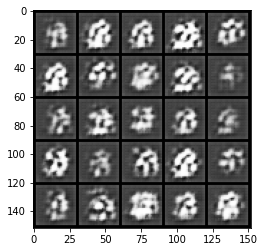

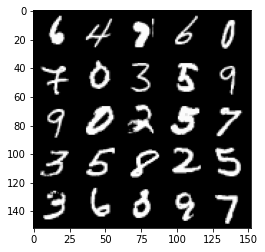

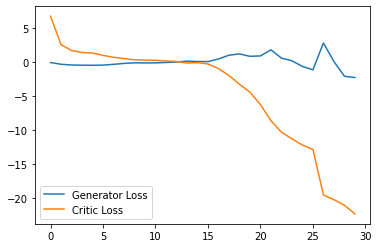

Step 650: Generator loss: -3.542623102068901, critic loss: -21.487278526306156


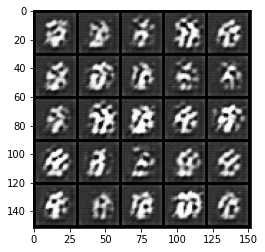

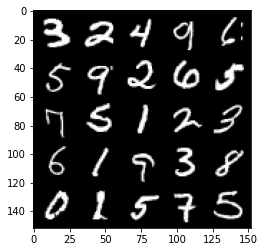

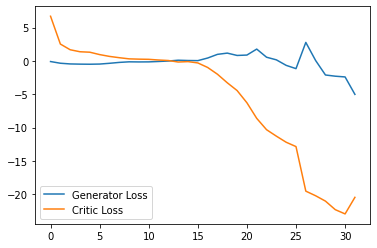

Step 700: Generator loss: -5.731429351568222, critic loss: -16.071942495346068


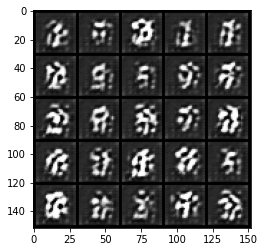

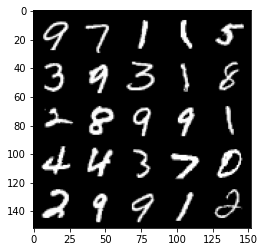

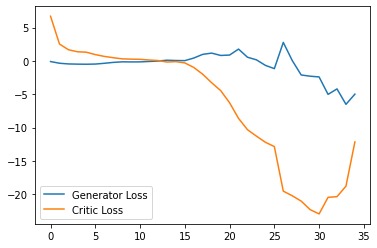

Step 750: Generator loss: -6.312514042854309, critic loss: -10.708399357318878


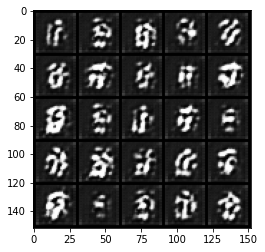

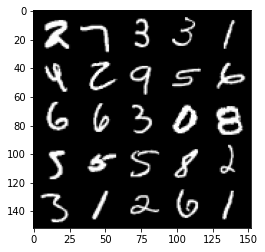

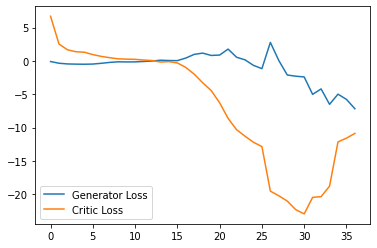

Step 800: Generator loss: -5.991488180160522, critic loss: -6.211269556939602


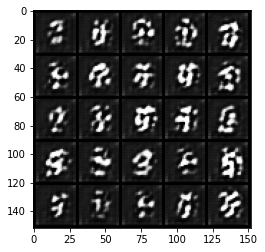

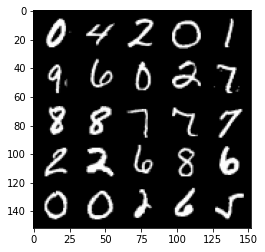

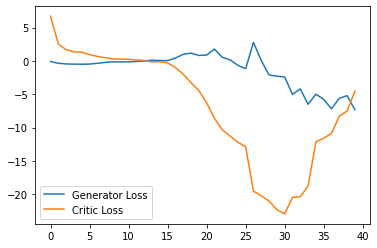

Step 850: Generator loss: -0.8268477777764202, critic loss: -1.4734065024852754


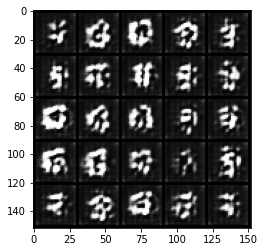

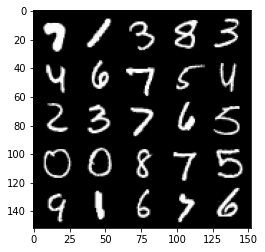

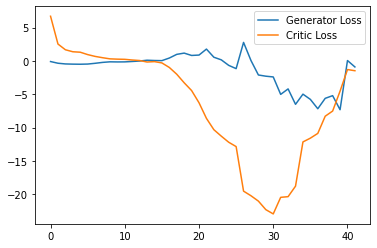

Step 900: Generator loss: -2.368567581176758, critic loss: -2.4118729248046877


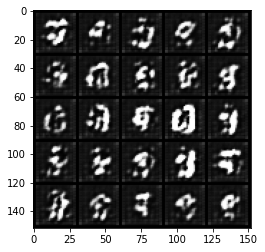

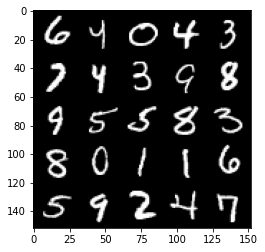

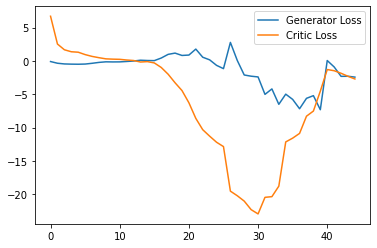

  0%|          | 0/469 [00:00<?, ?it/s]

Step 950: Generator loss: -3.6235271471738817, critic loss: -4.646524908065797


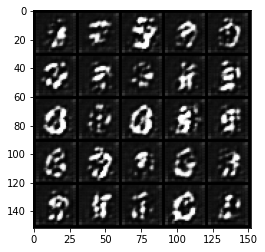

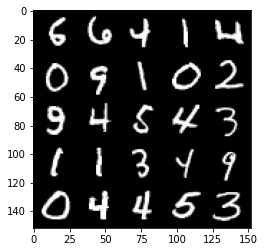

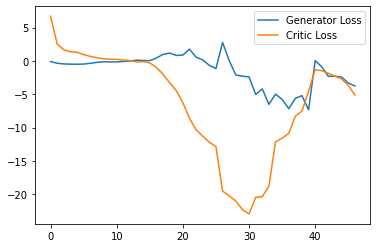

Step 1000: Generator loss: -3.7638965141773224, critic loss: -5.908912811517714


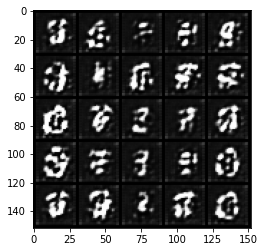

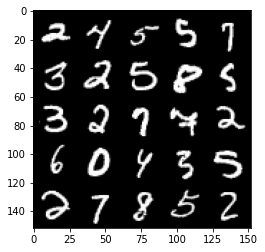

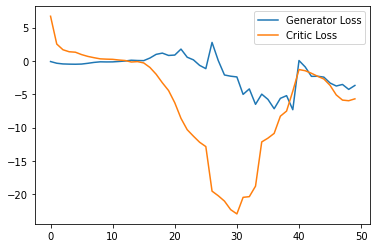

Step 1050: Generator loss: -3.7957355880737307, critic loss: -5.840325913190842


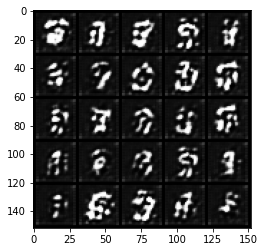

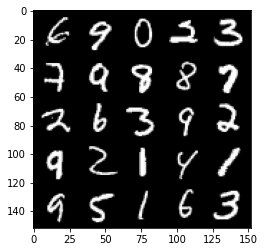

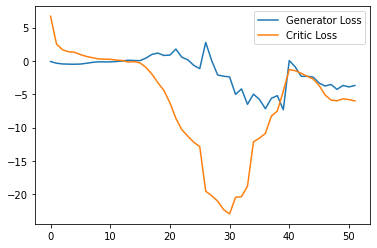

Step 1100: Generator loss: -3.577515373826027, critic loss: -5.80443765926361


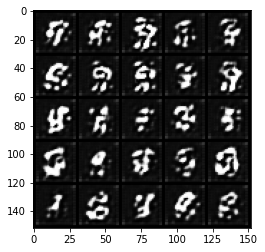

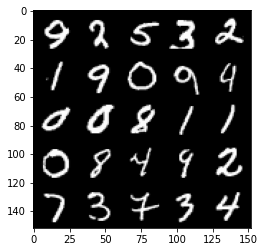

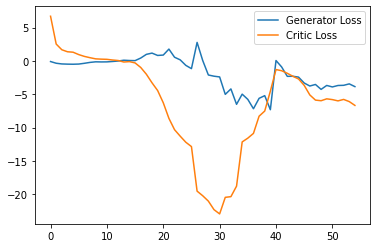

Step 1150: Generator loss: -1.2775545682013034, critic loss: -3.1733912060260767


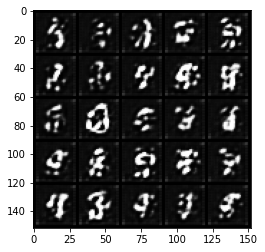

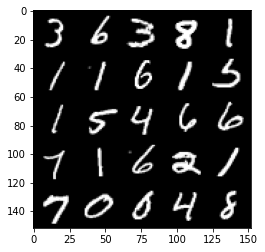

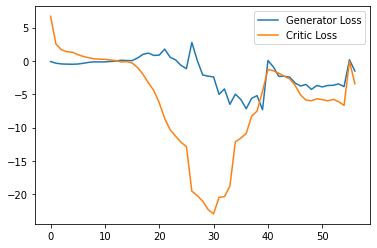

Step 1200: Generator loss: -3.0999856735765934, critic loss: -6.034865429997444


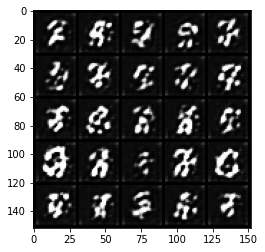

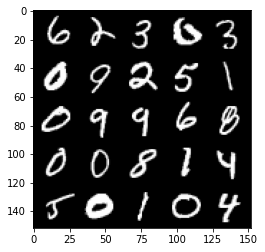

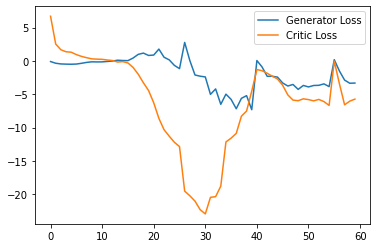

Step 1250: Generator loss: -2.278003413975239, critic loss: -4.730962538361548


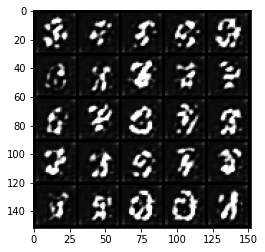

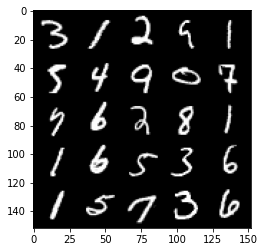

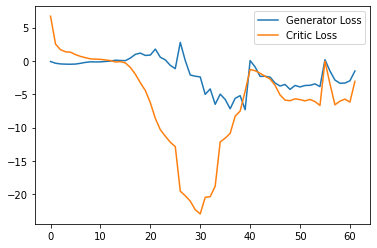

Step 1300: Generator loss: -2.863644905090332, critic loss: -5.595028213262558


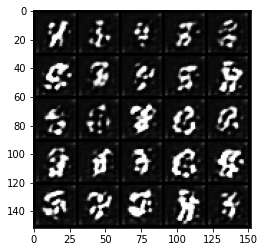

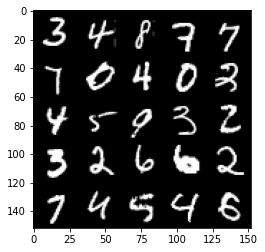

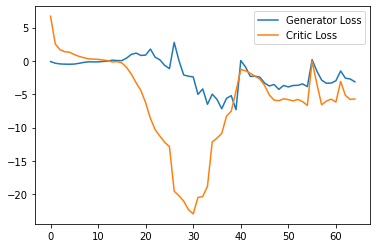

Step 1350: Generator loss: -2.991775545179844, critic loss: -5.5347991491556146


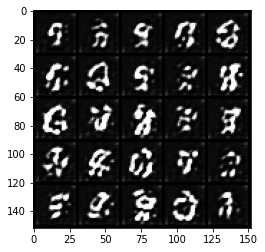

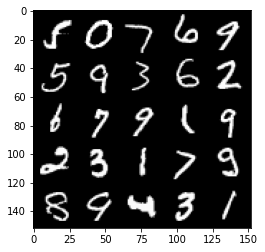

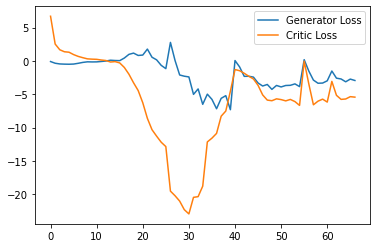

Step 1400: Generator loss: -3.064972767829895, critic loss: -5.5795299242734915


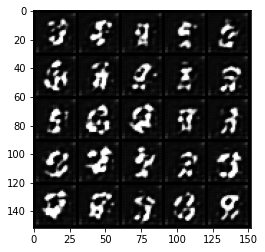

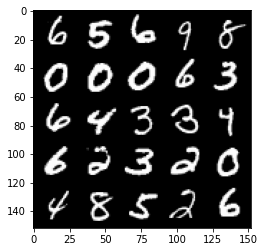

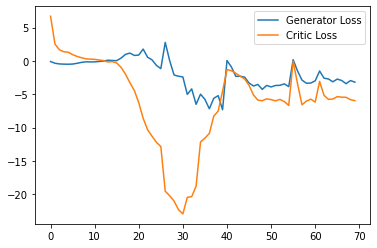

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1450: Generator loss: -3.0537829899787905, critic loss: -5.983085712671278


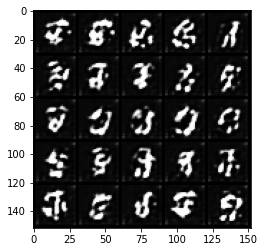

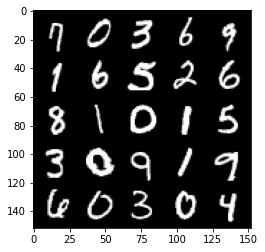

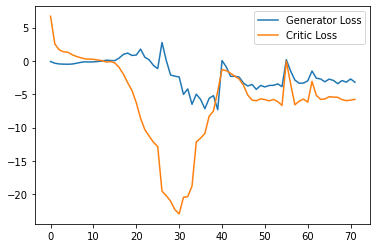

Step 1500: Generator loss: -3.3844225424528123, critic loss: -5.843026282072067


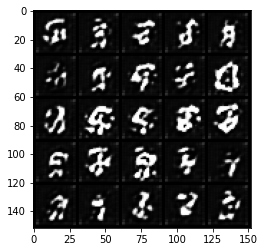

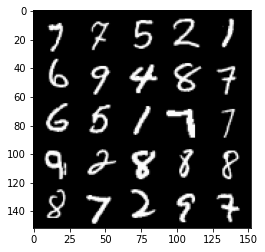

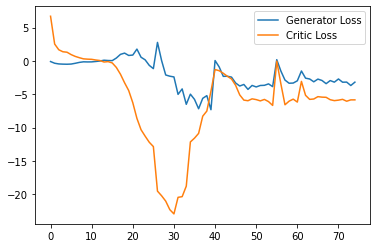

Step 1550: Generator loss: -3.127836265563965, critic loss: -5.826498612642286


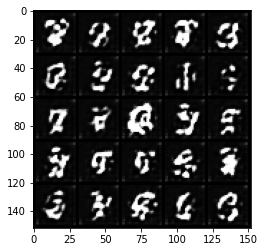

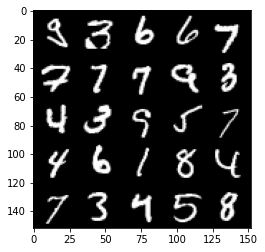

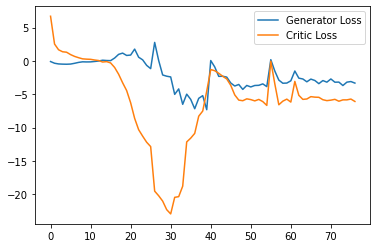

Step 1600: Generator loss: -3.1716448974609377, critic loss: -6.104579386234285


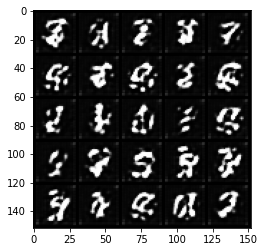

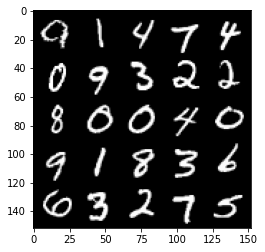

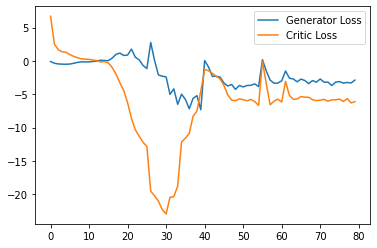

Step 1650: Generator loss: -3.4064968007802965, critic loss: -5.90525159907341


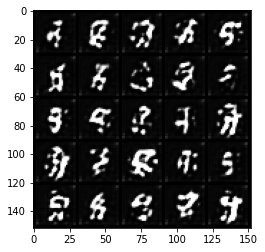

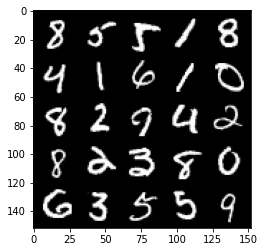

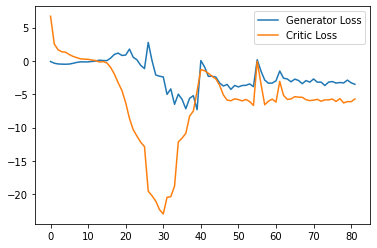

Step 1700: Generator loss: -3.5381131744384766, critic loss: -5.998590085029601


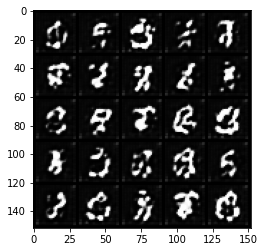

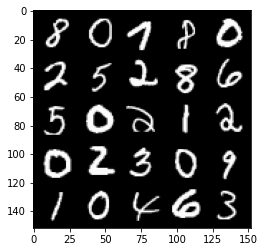

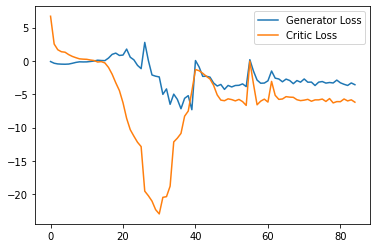

Step 1750: Generator loss: -3.562265844345093, critic loss: -6.013457990407943


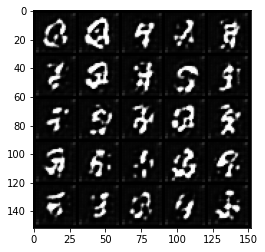

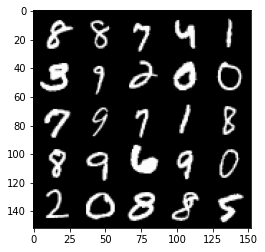

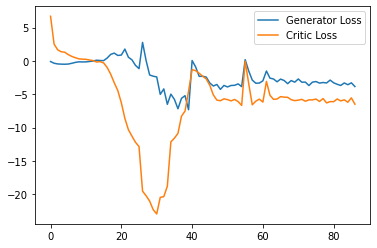

Step 1800: Generator loss: -3.173279436826706, critic loss: -6.052323074698449


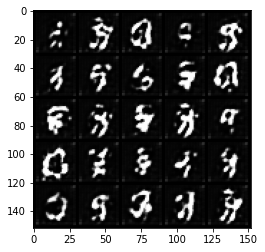

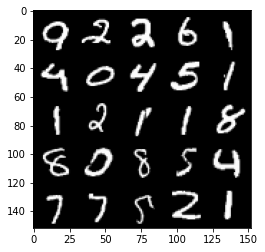

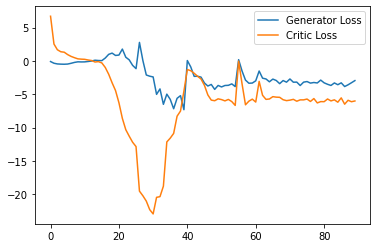

Step 1850: Generator loss: -3.7891536712646485, critic loss: -6.3821428532600395


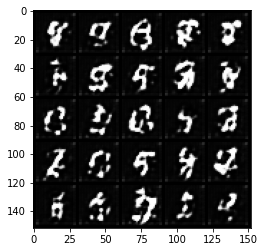

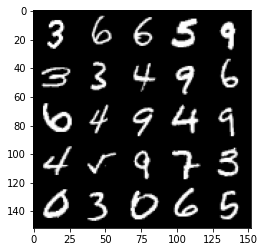

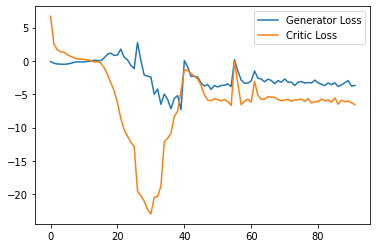

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1900: Generator loss: -3.6036050796508787, critic loss: -6.077764193534851


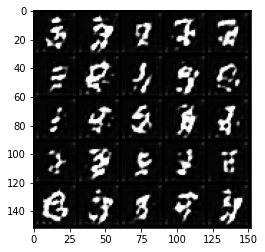

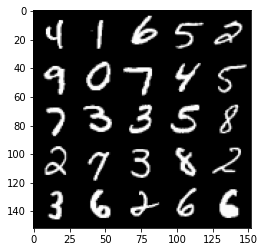

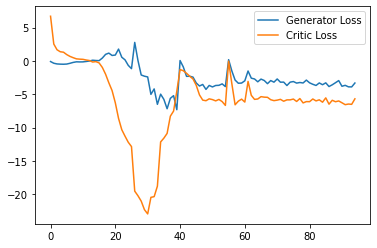

Step 1950: Generator loss: -3.620248127579689, critic loss: -6.423610846519473


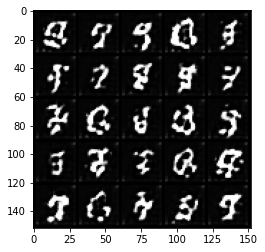

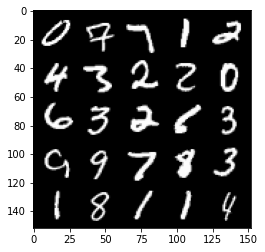

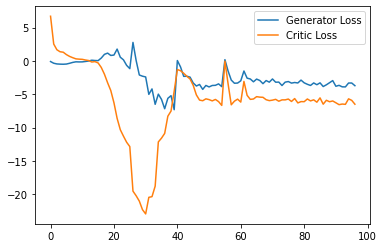

Step 2000: Generator loss: -3.6339079862833024, critic loss: -6.623785862445831


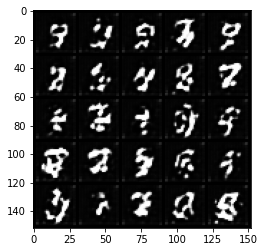

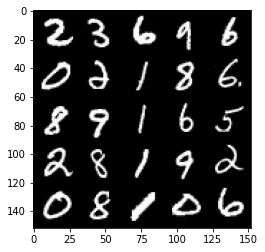

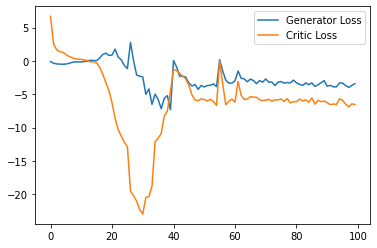

Step 2050: Generator loss: -3.2439571242034435, critic loss: -6.784893337726593


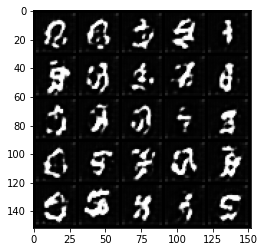

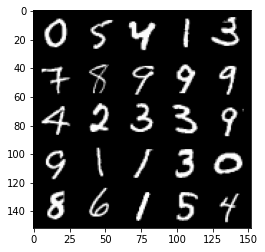

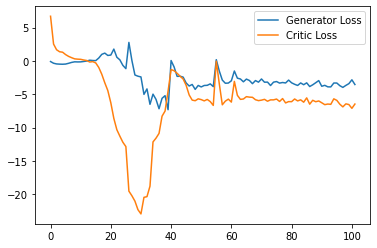

Step 2100: Generator loss: -2.8533977031707765, critic loss: -6.552502209901812


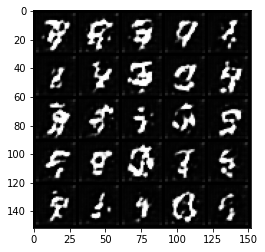

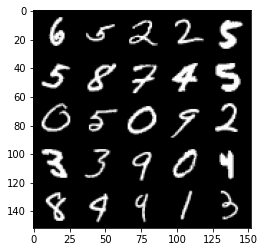

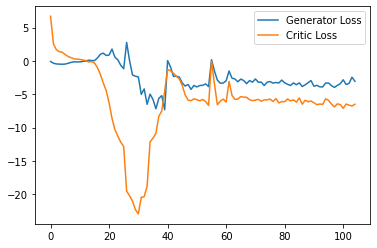

Step 2150: Generator loss: -2.9160215735435484, critic loss: -6.800567768573759


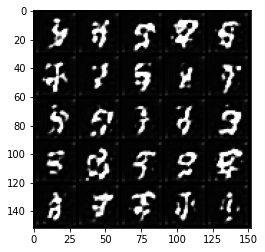

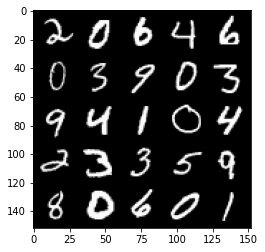

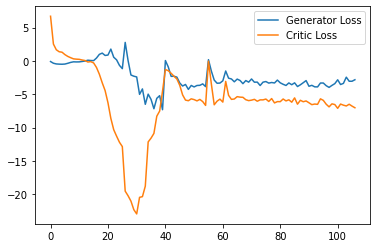

Step 2200: Generator loss: -2.4219155102968215, critic loss: -6.904632988214495


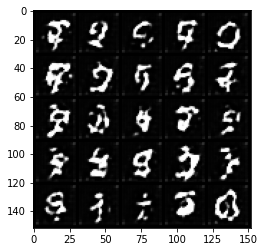

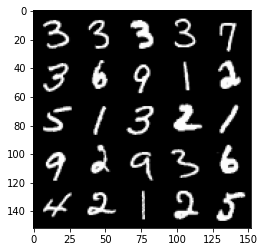

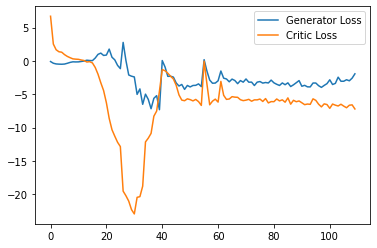

Step 2250: Generator loss: -1.8644371071457864, critic loss: -6.738951210975647


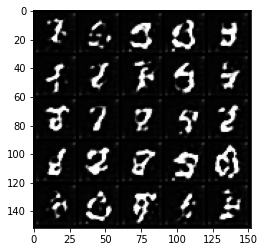

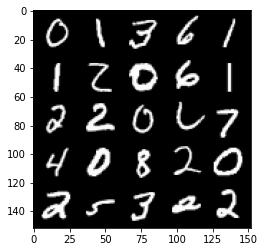

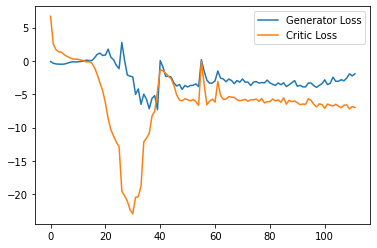

Step 2300: Generator loss: -1.5873397180438042, critic loss: -6.611541207790378


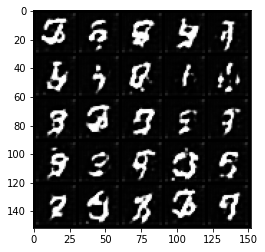

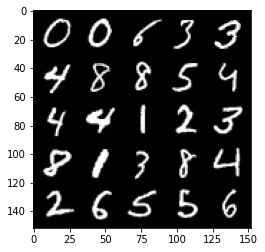

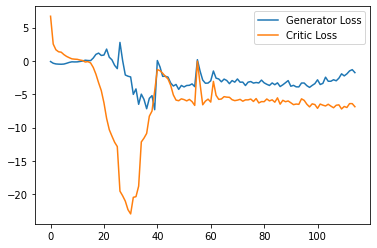

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2350: Generator loss: -1.2099681478738784, critic loss: -7.153823252677917


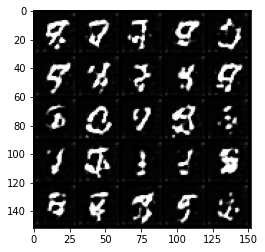

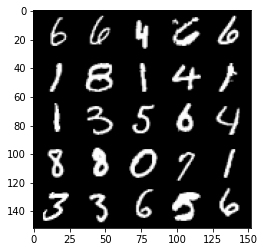

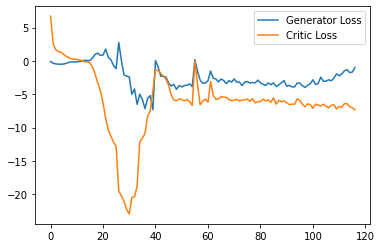

Step 2400: Generator loss: -0.5638427835702896, critic loss: -6.329061263084412


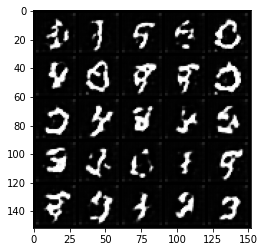

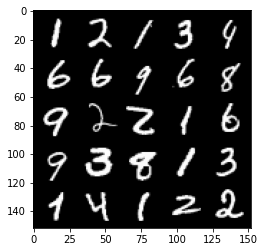

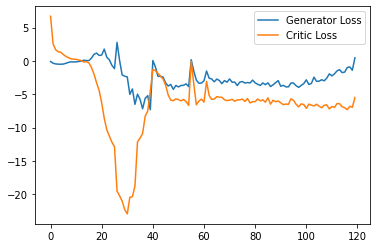

Step 2450: Generator loss: -0.48775167152285576, critic loss: -6.691649343013762


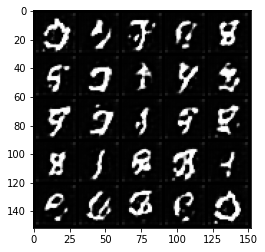

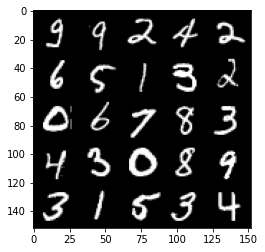

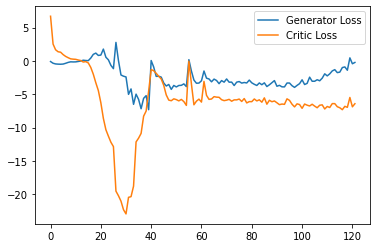

Step 2500: Generator loss: 0.6116572691500187, critic loss: -6.042754241228101


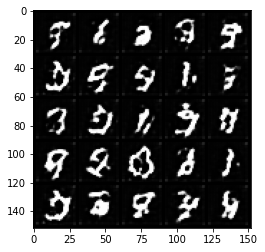

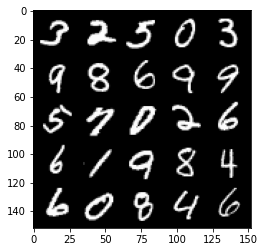

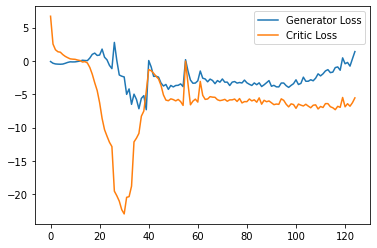

Step 2550: Generator loss: 0.7716874737292528, critic loss: -6.55923414647579


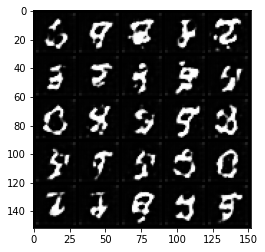

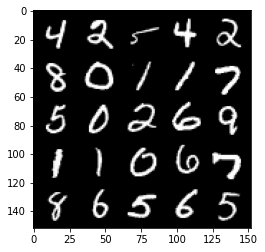

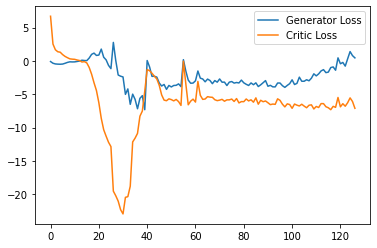

Step 2600: Generator loss: 1.1426719842106103, critic loss: -6.615042985677719


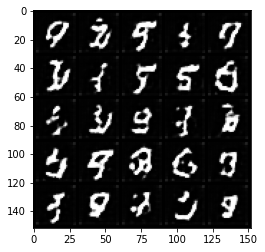

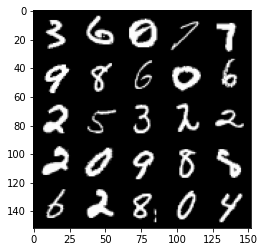

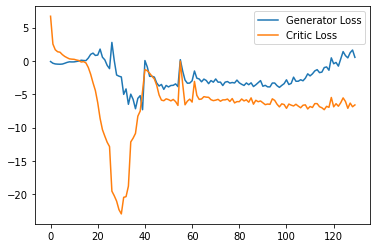

Step 2650: Generator loss: 1.9424445228278637, critic loss: -7.160848105907441


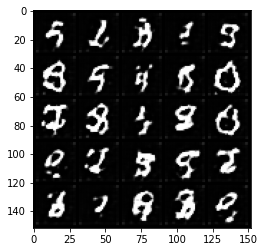

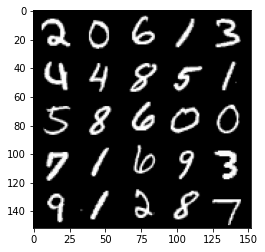

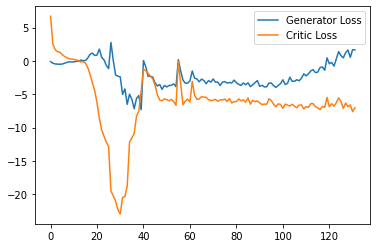

Step 2700: Generator loss: 3.5991212970018385, critic loss: -6.010194125294686


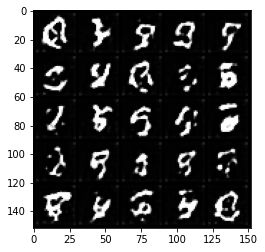

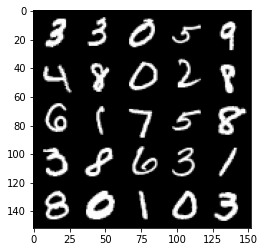

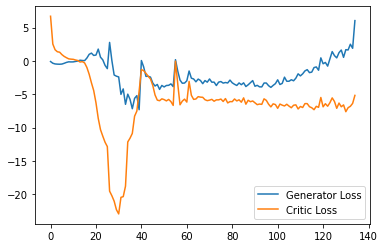

Step 2750: Generator loss: 2.6172098755836486, critic loss: -6.866686230778694


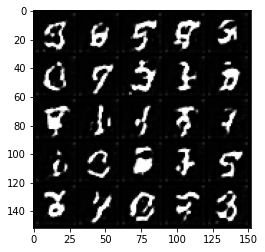

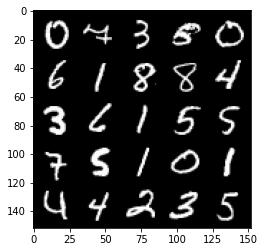

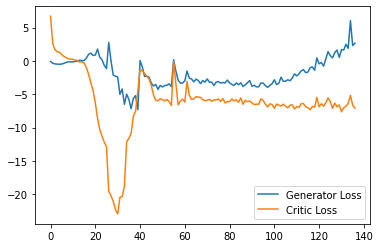

Step 2800: Generator loss: 4.17205597281456, critic loss: -6.327093553662303


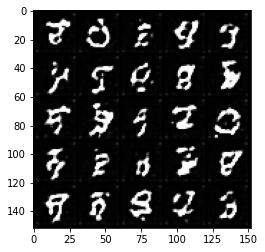

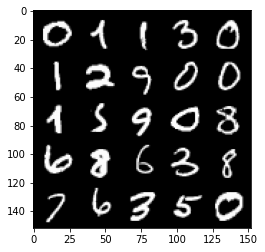

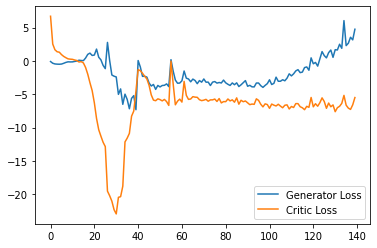

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2850: Generator loss: 4.983153855800628, critic loss: -6.892006346225741


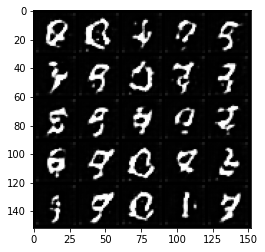

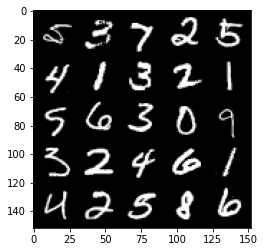

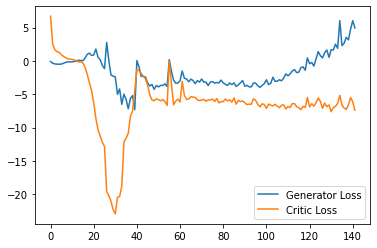

Step 2900: Generator loss: 5.278661379814148, critic loss: -6.960022812843323


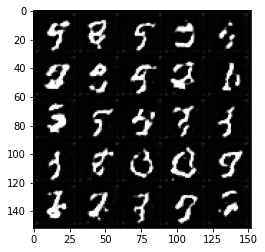

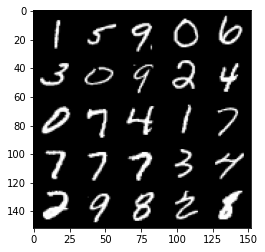

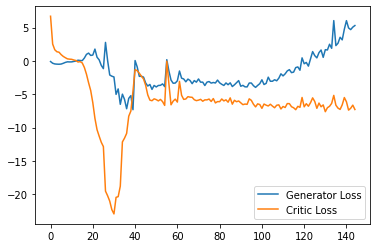

Step 2950: Generator loss: 5.407904617786407, critic loss: -7.335522670269011


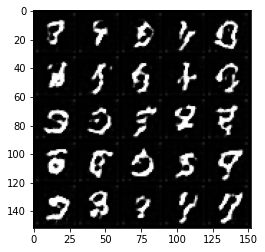

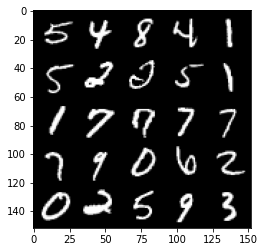

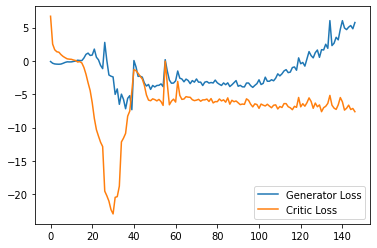

Step 3000: Generator loss: 6.563591485023498, critic loss: -6.628019771575929


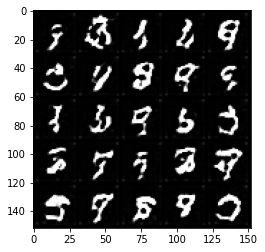

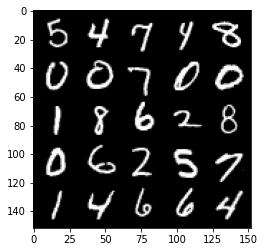

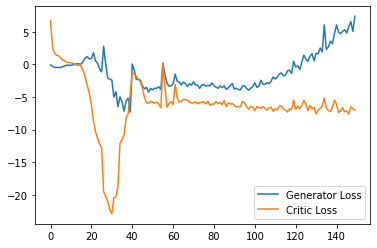

Step 3050: Generator loss: 8.428967628479004, critic loss: -5.9546185321807865


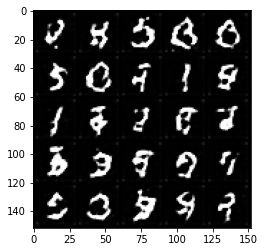

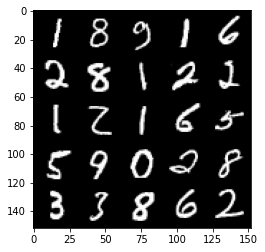

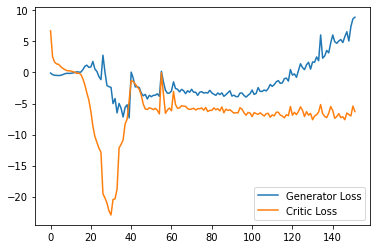

Step 3100: Generator loss: 9.909410605430603, critic loss: -5.300836975812913


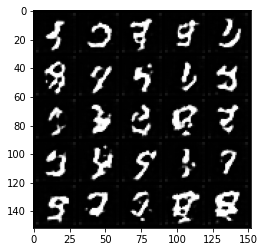

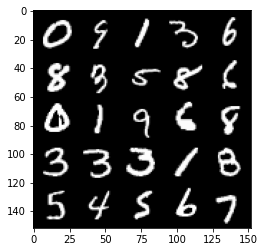

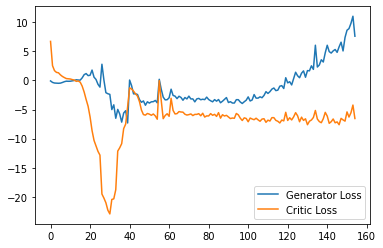

Step 3150: Generator loss: 9.346369142532348, critic loss: -6.969885187983514


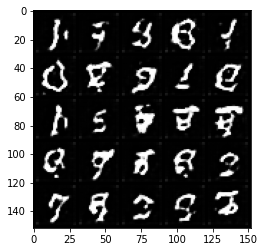

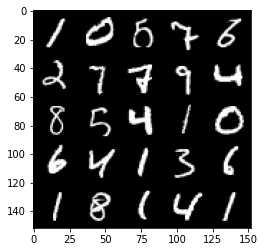

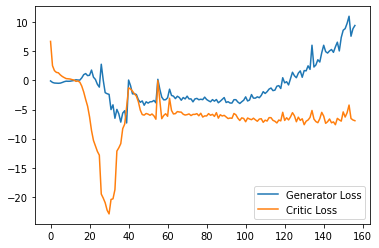

Step 3200: Generator loss: 8.577684907913207, critic loss: -6.9921504004001624


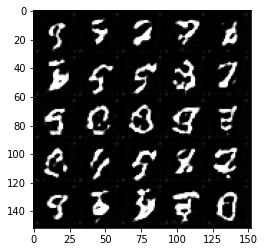

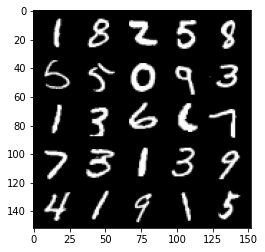

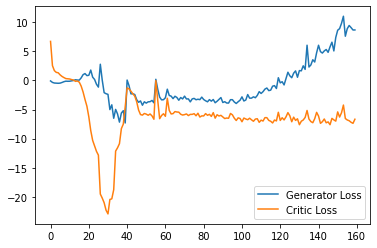

Step 3250: Generator loss: 9.487622756958007, critic loss: -6.961939770460127


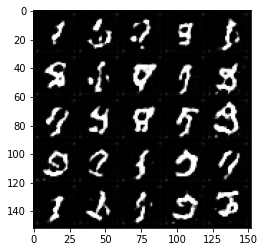

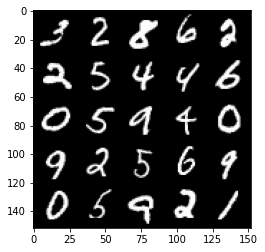

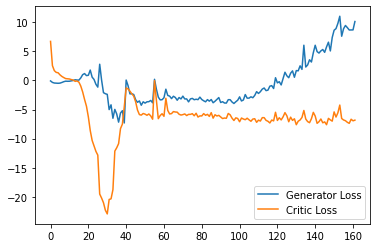

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3300: Generator loss: 11.282233810424804, critic loss: -6.575875070214271


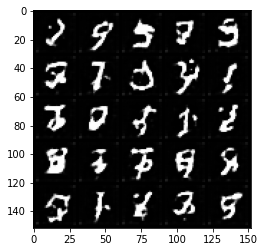

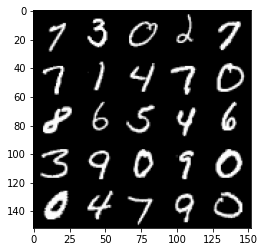

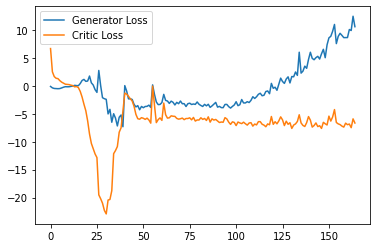

Step 3350: Generator loss: 12.079170322418213, critic loss: -5.570231233835221


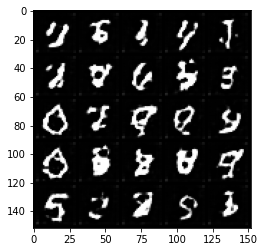

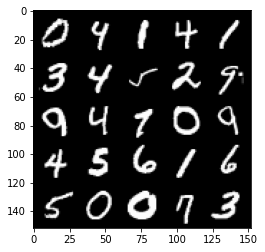

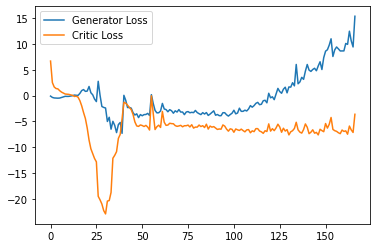

Step 3400: Generator loss: 11.182050018310546, critic loss: -6.5166071722507475


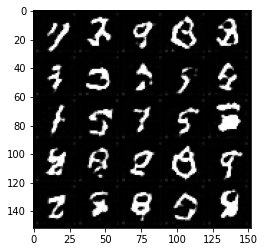

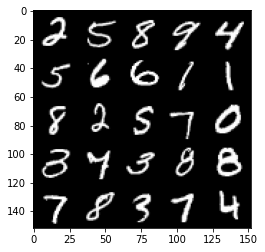

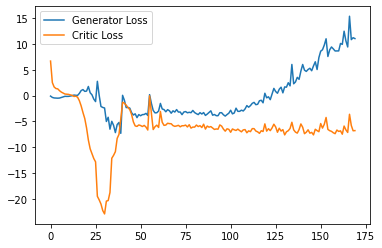

Step 3450: Generator loss: 13.953766975402832, critic loss: -5.837458099484444


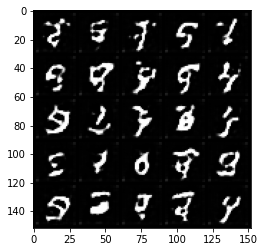

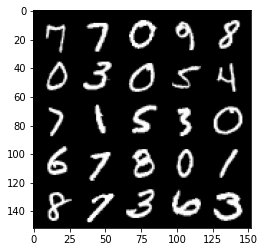

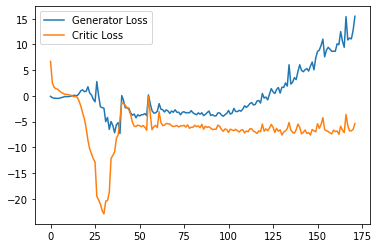

Step 3500: Generator loss: 13.308742446899414, critic loss: -7.264882489442824


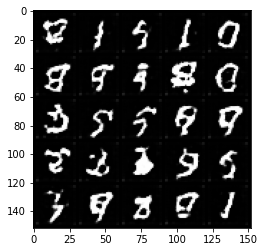

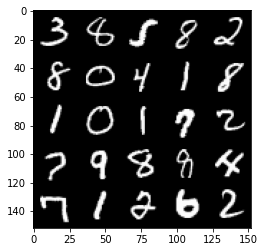

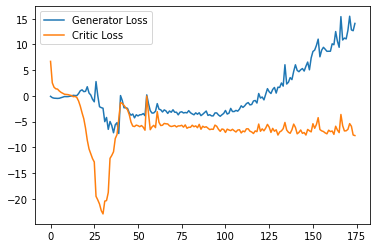

Step 3550: Generator loss: 13.909962177276611, critic loss: -6.281343773126602


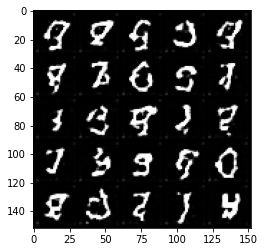

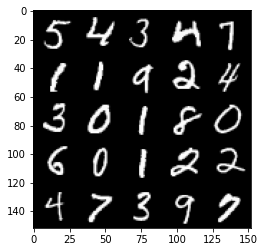

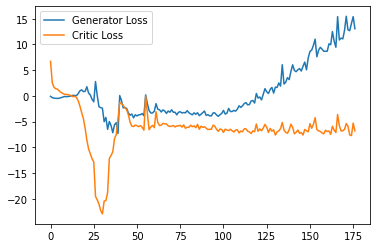

Step 3600: Generator loss: 15.147256145477295, critic loss: -6.206280782580377


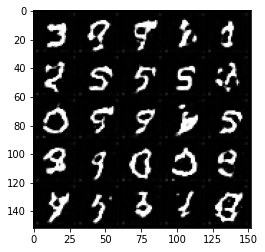

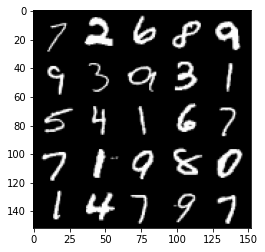

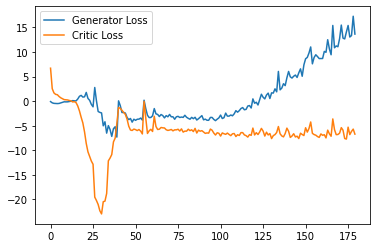

Step 3650: Generator loss: 15.033948211669921, critic loss: -7.570345399141311


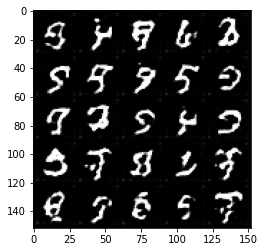

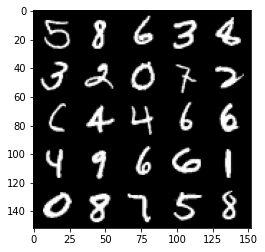

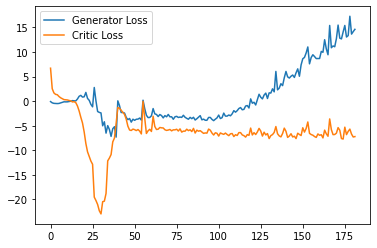

Step 3700: Generator loss: 15.145495052337646, critic loss: -6.6048151699304585


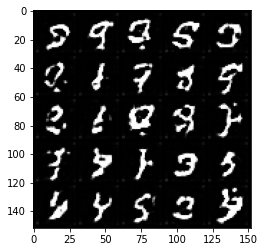

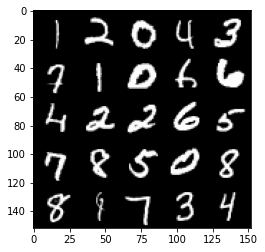

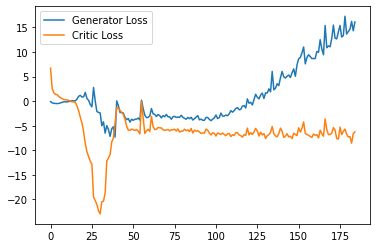

Step 3750: Generator loss: 17.17264242172241, critic loss: -6.4043363921642324


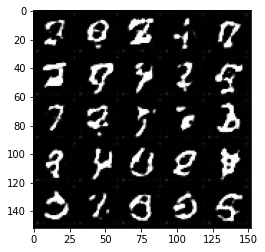

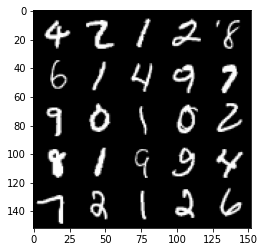

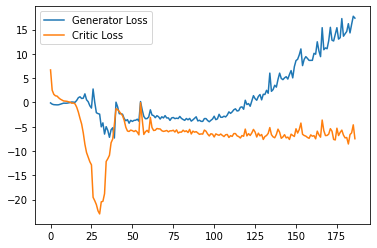

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3800: Generator loss: 20.188134803771973, critic loss: -5.700405042648316


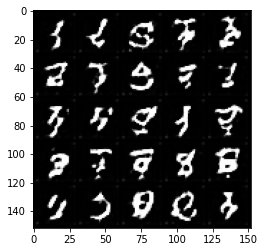

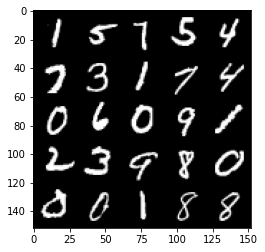

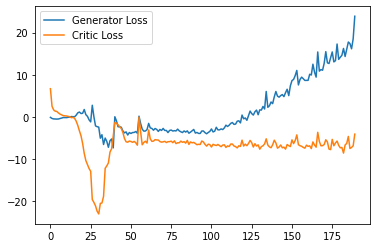

Step 3850: Generator loss: 17.97491313934326, critic loss: -7.484482072234153


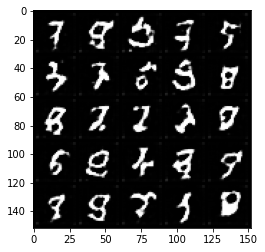

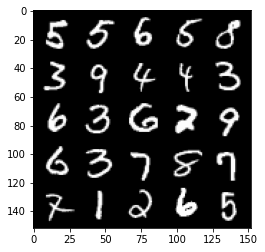

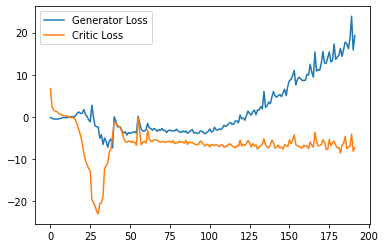

Step 3900: Generator loss: 18.10499858856201, critic loss: -8.51001373720169


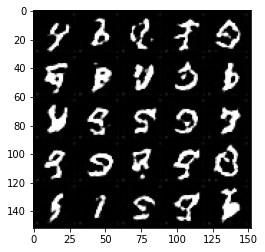

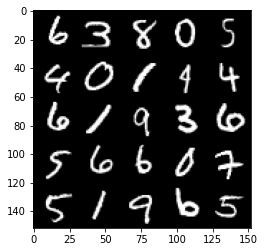

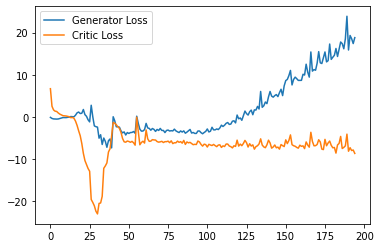

Step 3950: Generator loss: 23.76642011642456, critic loss: -3.476092082381249


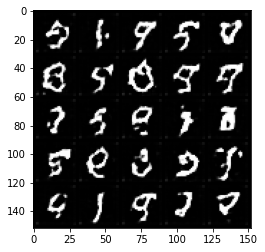

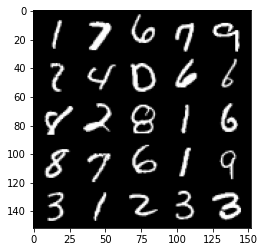

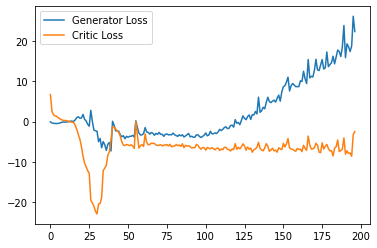

Step 4000: Generator loss: 21.19267292022705, critic loss: -6.075043341279029


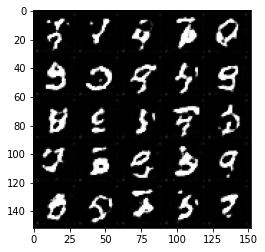

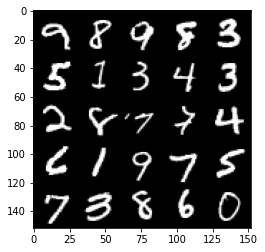

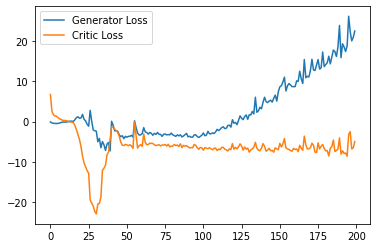

Step 4050: Generator loss: 23.364501914978028, critic loss: -4.39407030415535


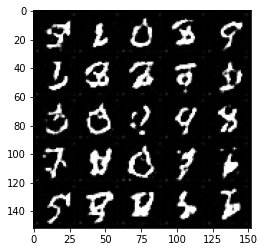

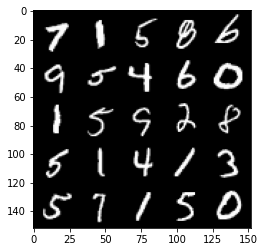

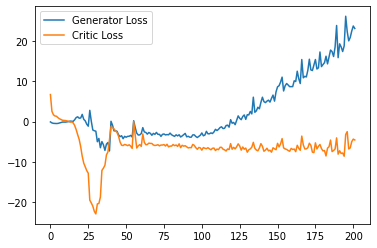

Step 4100: Generator loss: 23.26445919036865, critic loss: -5.8820279591083535


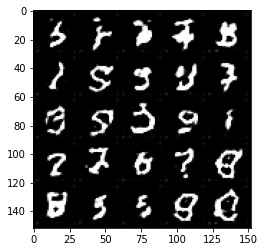

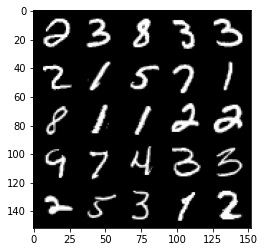

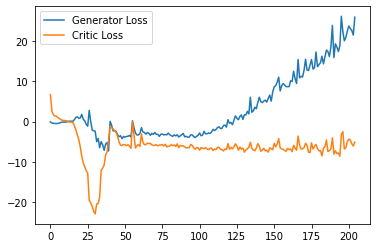

Step 4150: Generator loss: 23.04615303039551, critic loss: -6.309777047514915


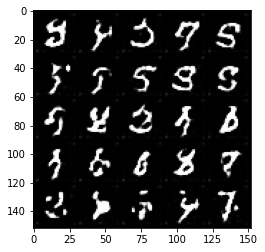

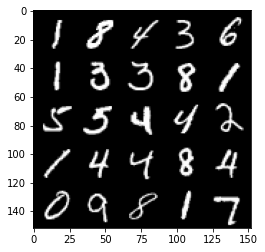

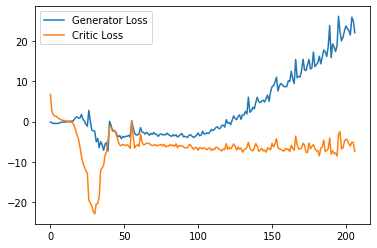

Step 4200: Generator loss: 23.407537994384764, critic loss: -6.8881352809667575


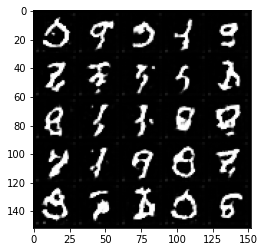

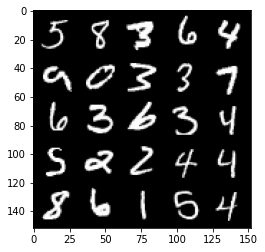

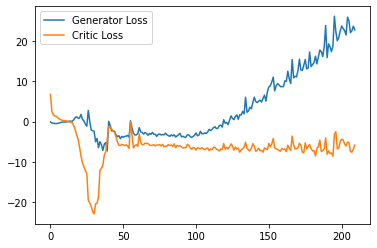

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4250: Generator loss: 24.50342403411865, critic loss: -6.637858939886094


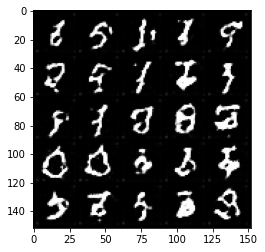

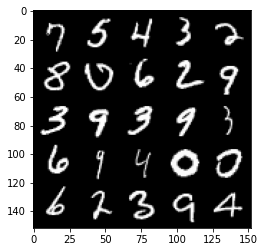

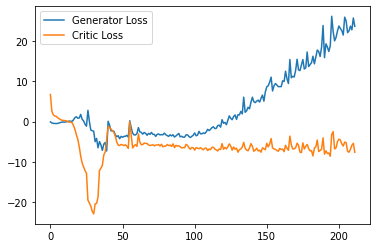

Step 4300: Generator loss: 26.85007968902588, critic loss: -6.257802362561226


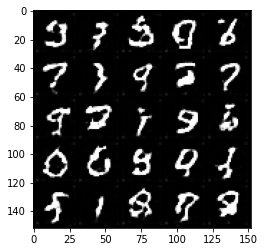

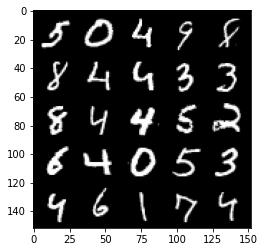

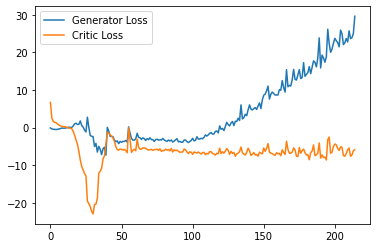

Step 4350: Generator loss: 28.277683944702147, critic loss: -5.805626263976097


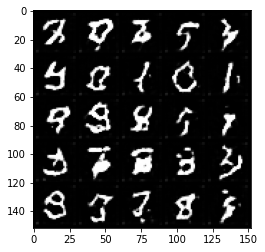

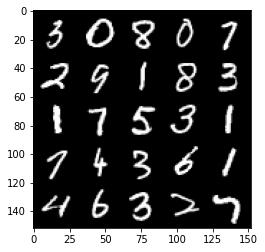

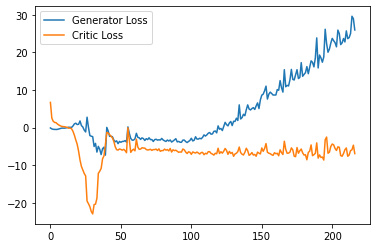

Step 4400: Generator loss: 31.44046630859375, critic loss: -3.536619006156921


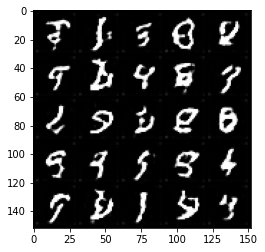

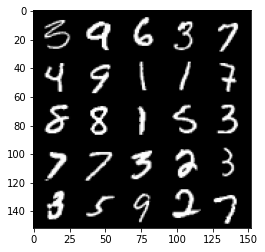

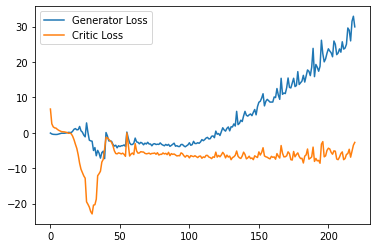

Step 4450: Generator loss: 30.458581581115723, critic loss: -5.298829523563385


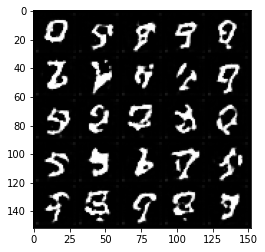

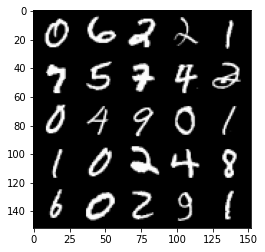

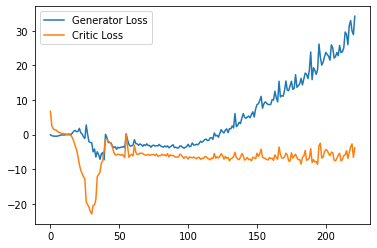

Step 4500: Generator loss: 28.116878700256347, critic loss: -7.4632171241045


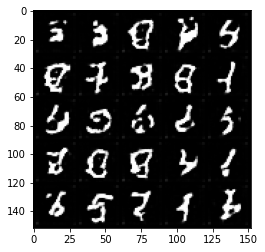

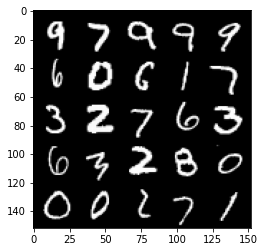

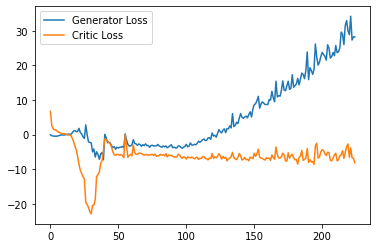

Step 4550: Generator loss: 30.69759132385254, critic loss: -6.474991118311883


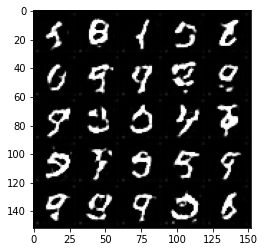

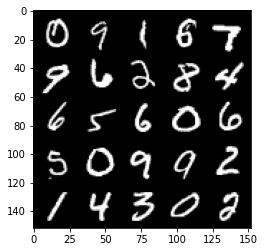

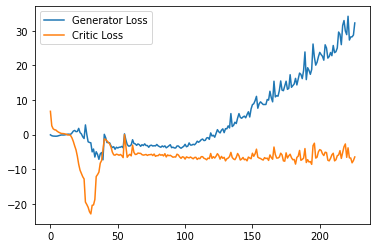

Step 4600: Generator loss: 29.66239532470703, critic loss: -7.78763273024559


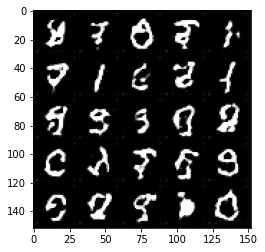

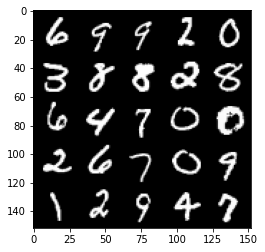

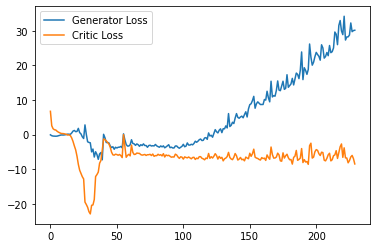

Step 4650: Generator loss: 33.48532749176025, critic loss: -5.796667400956156


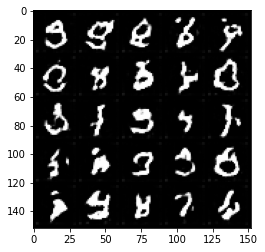

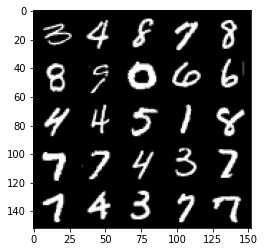

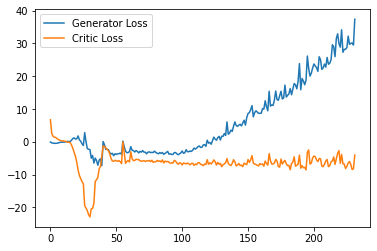

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4700: Generator loss: 31.77555461883545, critic loss: -6.486247533798217


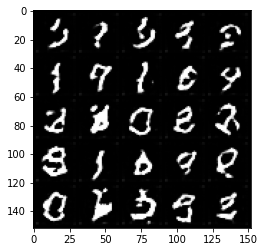

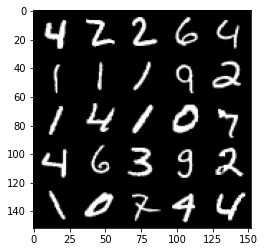

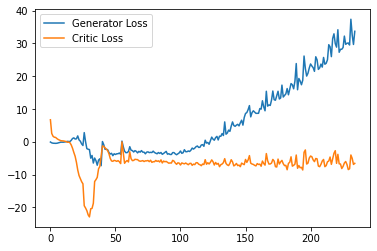

Step 4750: Generator loss: 32.68916709899902, critic loss: -6.7147133431434645


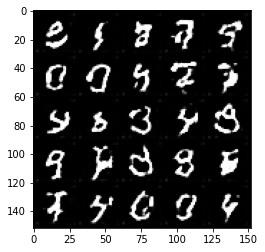

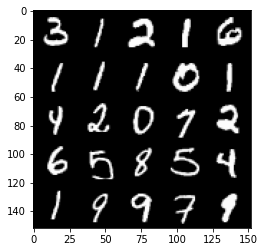

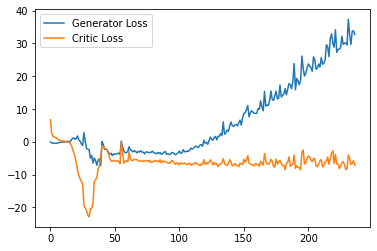

Step 4800: Generator loss: 34.4296639251709, critic loss: -5.976241163849831


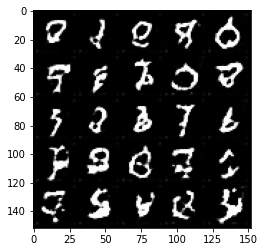

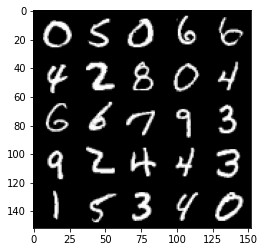

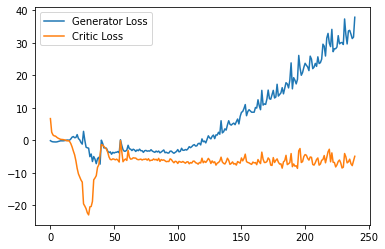

Step 4850: Generator loss: 34.885775604248046, critic loss: -4.912500931501388


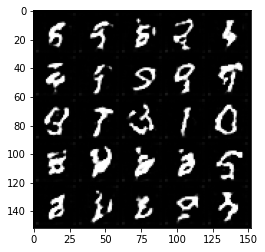

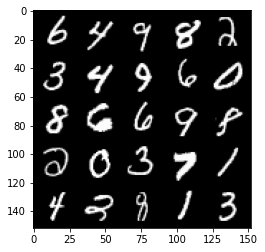

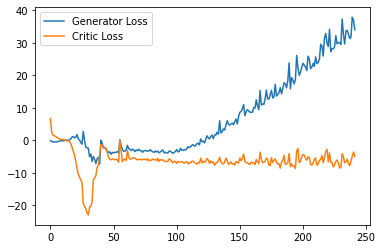

Step 4900: Generator loss: 36.69268825531006, critic loss: -5.03903812813759


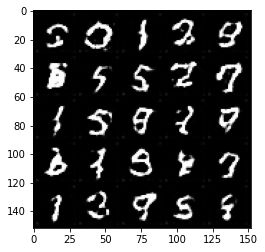

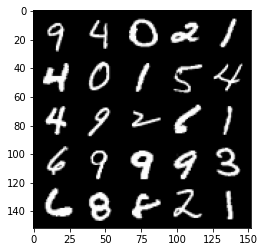

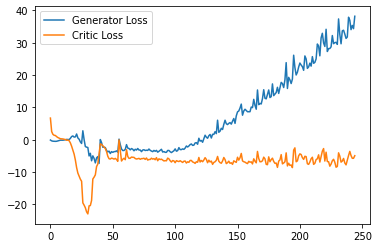

Step 4950: Generator loss: 36.28463737487793, critic loss: -5.582577931046485


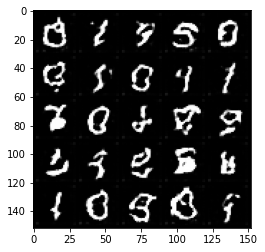

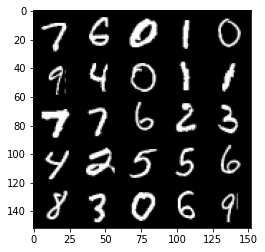

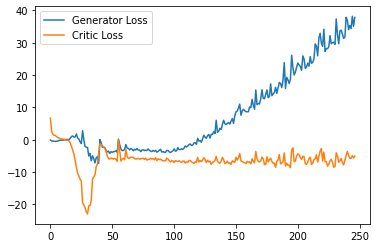

Step 5000: Generator loss: 38.50336475372315, critic loss: -4.6912218602895726


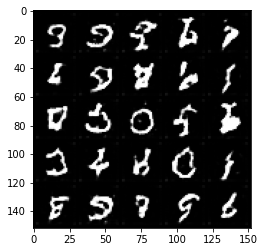

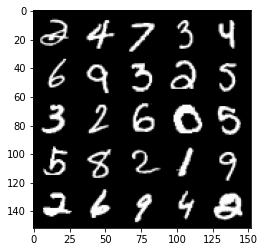

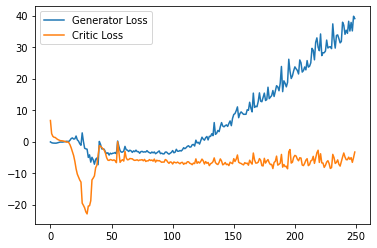

Step 5050: Generator loss: 35.97728225708008, critic loss: -6.912451985478404


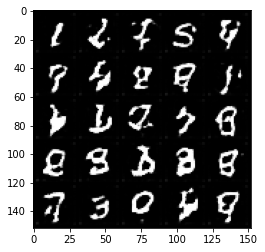

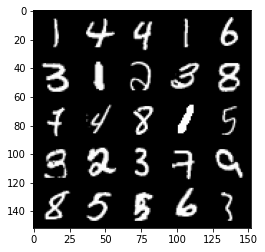

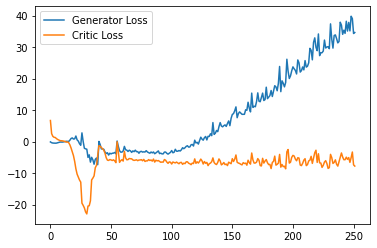

Step 5100: Generator loss: 39.344832000732424, critic loss: -5.290567766189574


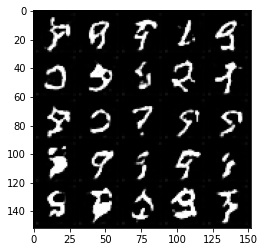

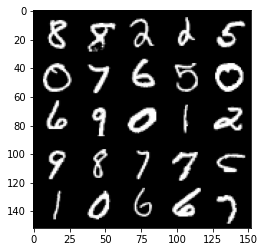

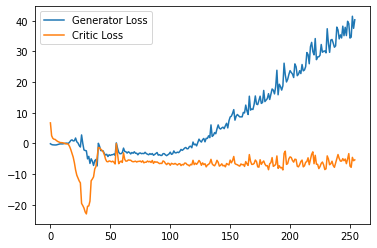

Step 5150: Generator loss: 38.790358505249024, critic loss: -5.564438754081726


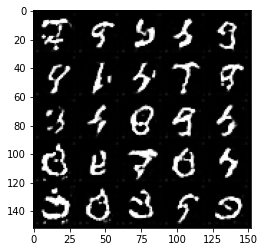

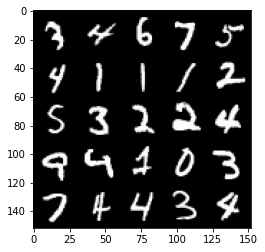

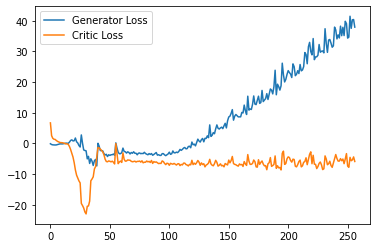

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5200: Generator loss: 39.36826873779297, critic loss: -6.127410628795625


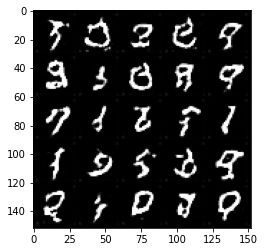

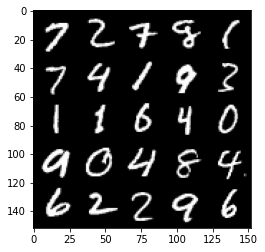

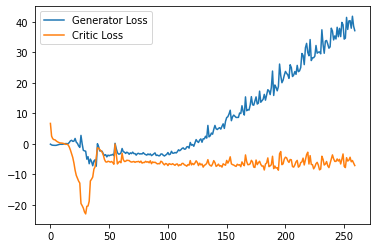

Step 5250: Generator loss: 41.82094451904297, critic loss: -5.077341945171356


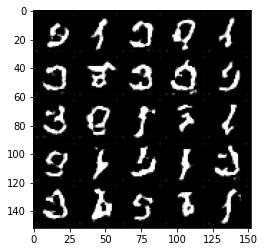

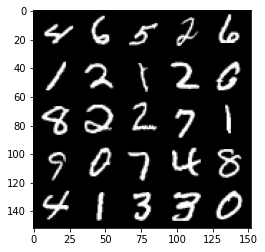

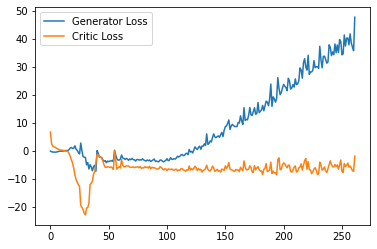

Step 5300: Generator loss: 42.6790357208252, critic loss: -5.502951581239699


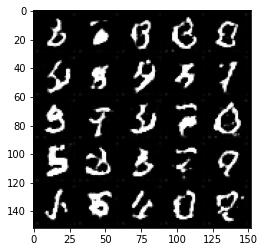

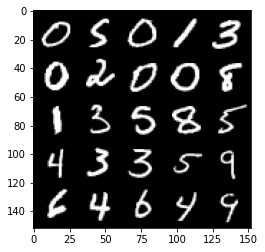

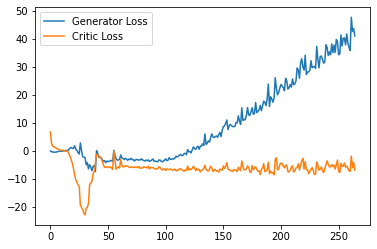

Step 5350: Generator loss: 42.92021492004395, critic loss: -5.976062846362592


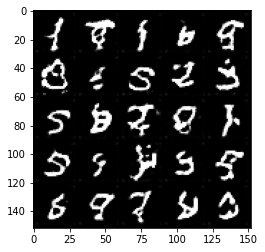

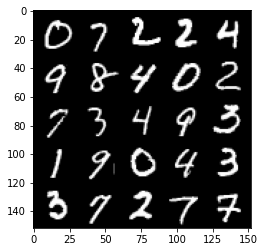

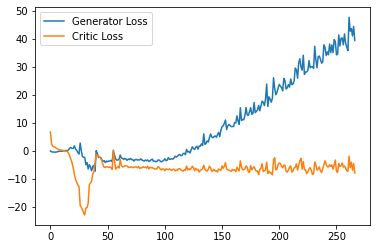

Step 5400: Generator loss: 41.76861488342285, critic loss: -5.915670969724656


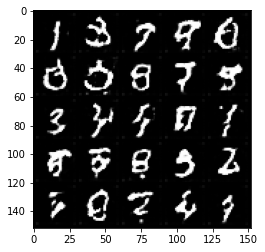

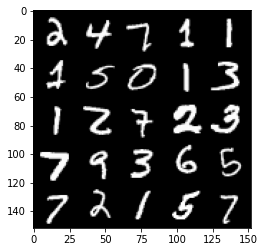

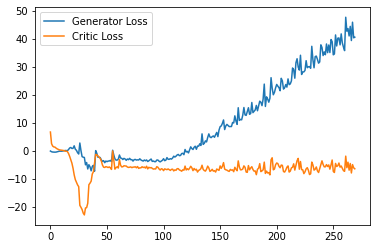

Step 5450: Generator loss: 41.314956207275394, critic loss: -6.368022937893866


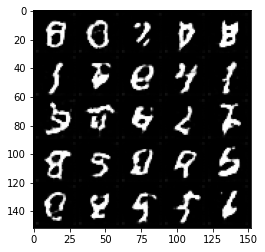

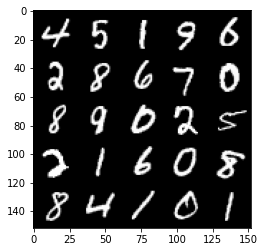

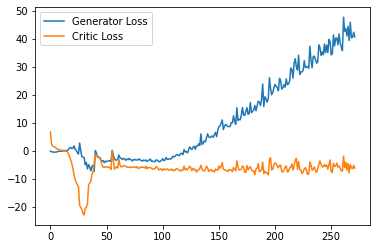

Step 5500: Generator loss: 43.65084373474121, critic loss: -7.334527398109434


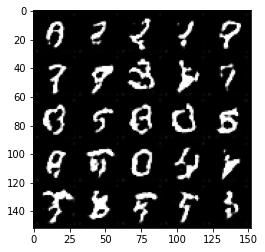

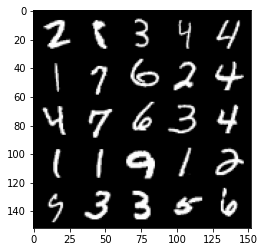

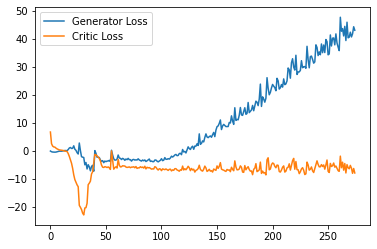

Step 5550: Generator loss: 47.16601951599121, critic loss: -4.9602932639122015


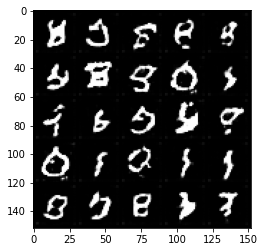

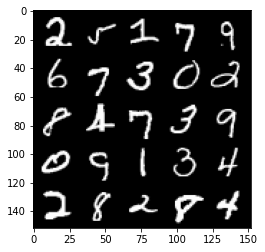

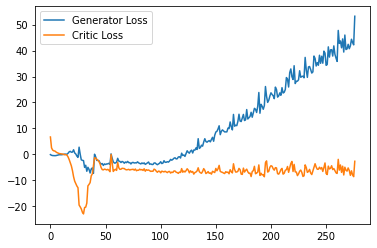

Step 5600: Generator loss: 43.20604103088379, critic loss: -6.684906029939651


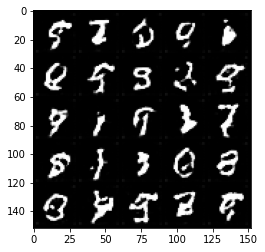

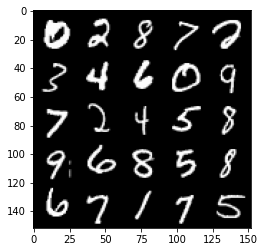

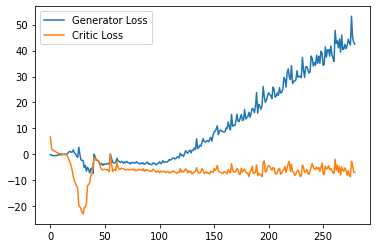

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5650: Generator loss: 47.77662200927735, critic loss: -4.471751467466356


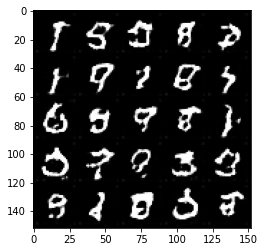

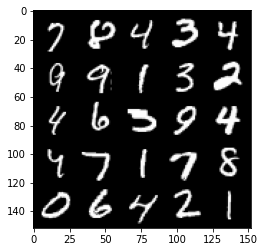

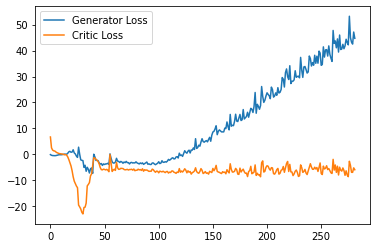

Step 5700: Generator loss: 49.839457778930665, critic loss: -5.269011057019234


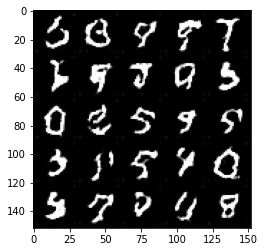

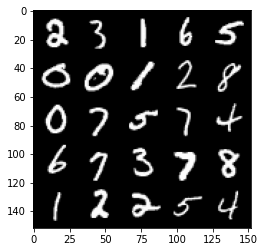

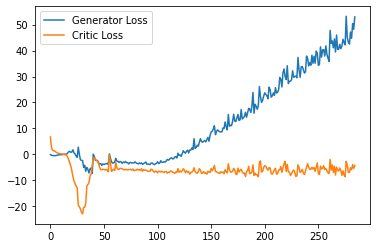

Step 5750: Generator loss: 47.92579612731934, critic loss: -5.65583115673065


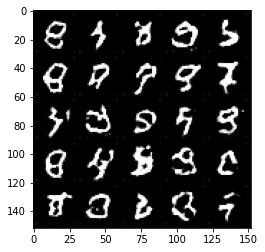

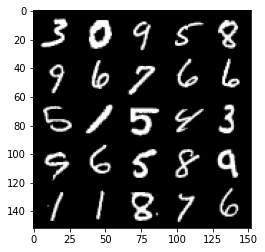

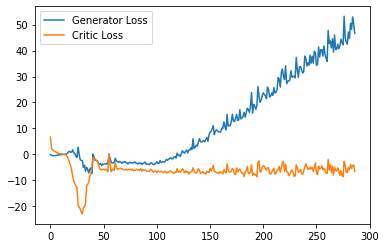

Step 5800: Generator loss: 49.694024353027345, critic loss: -5.324662692546846


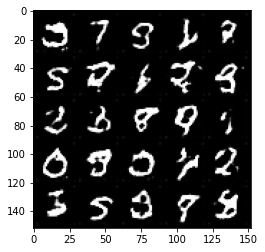

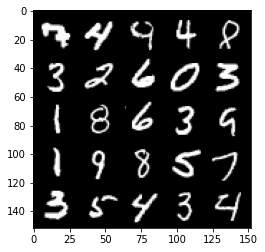

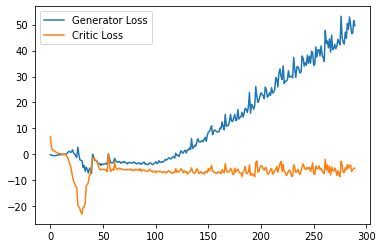

Step 5850: Generator loss: 49.81302177429199, critic loss: -5.8245893219709375


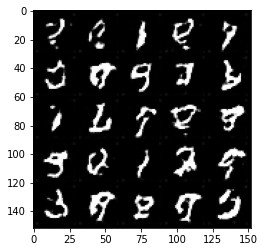

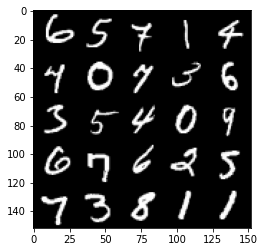

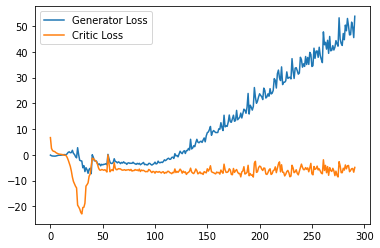

Step 5900: Generator loss: 51.31220664978027, critic loss: -4.941048074007034


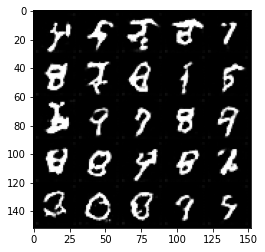

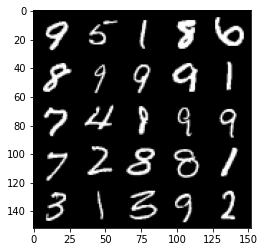

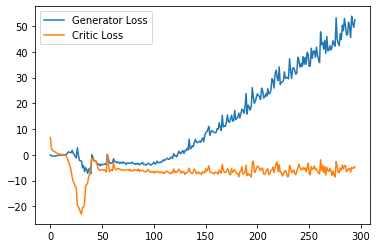

Step 5950: Generator loss: 48.45176803588867, critic loss: -9.031523735284807


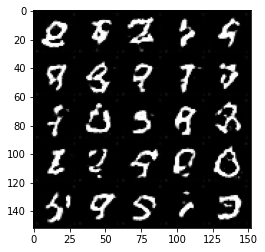

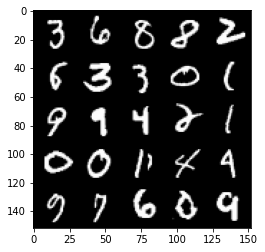

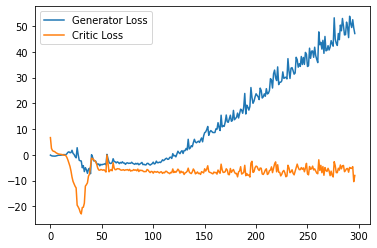

Step 6000: Generator loss: 54.00800582885742, critic loss: -4.371574286341667


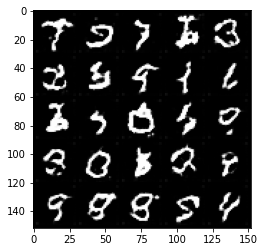

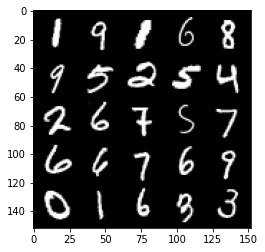

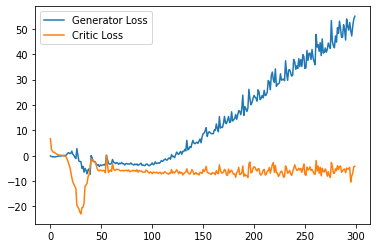

Step 6050: Generator loss: 49.86904335021973, critic loss: -5.93539151060581


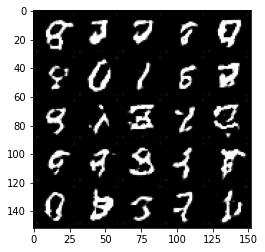

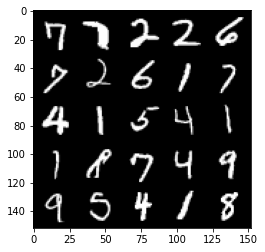

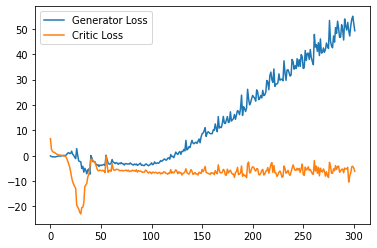

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6100: Generator loss: 55.4155239868164, critic loss: -3.43403384232521


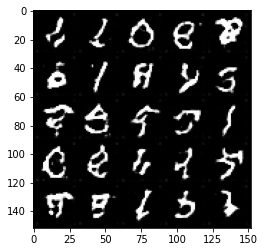

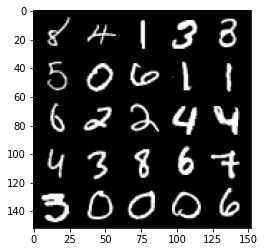

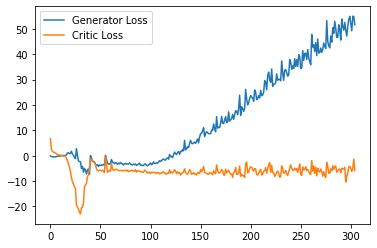

Step 6150: Generator loss: 54.36958465576172, critic loss: -5.305620437383653


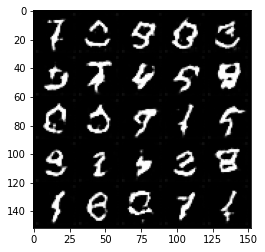

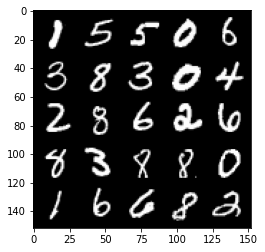

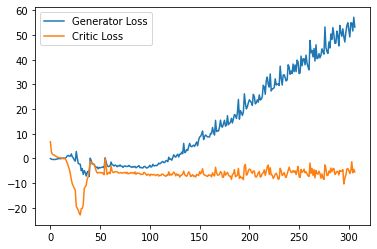

Step 6200: Generator loss: 51.582705078125, critic loss: -5.706278010964391


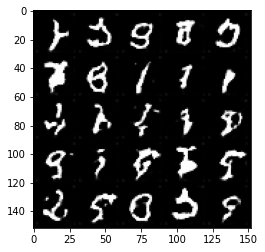

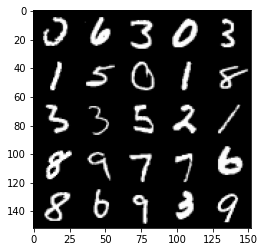

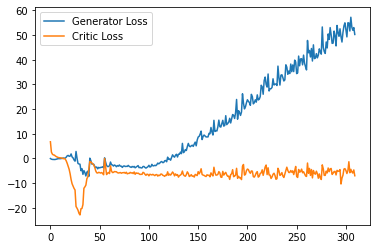

Step 6250: Generator loss: 55.2498966217041, critic loss: -4.999073982357977


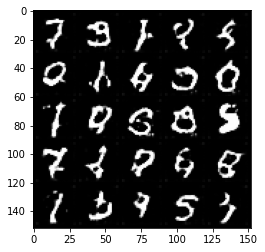

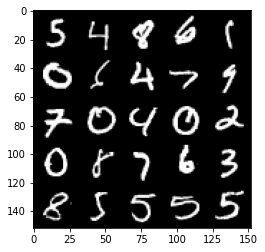

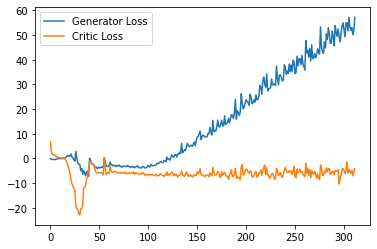

Step 6300: Generator loss: 53.958070297241214, critic loss: -5.902029287099837


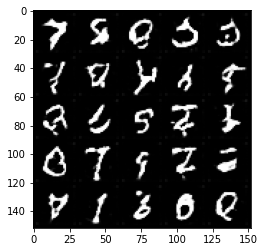

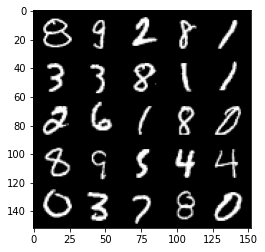

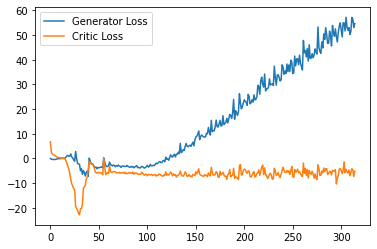

Step 6350: Generator loss: 56.089139785766605, critic loss: -4.9015239762067795


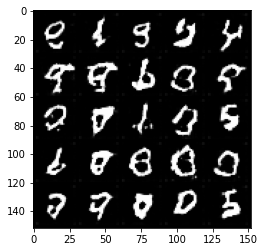

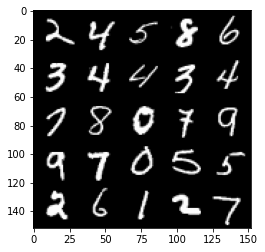

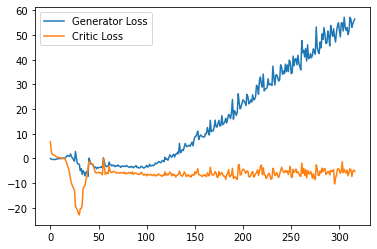

Step 6400: Generator loss: 53.74520416259766, critic loss: -5.776726637363432


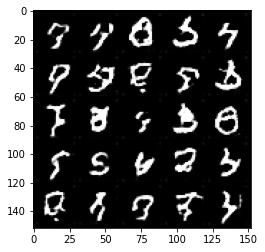

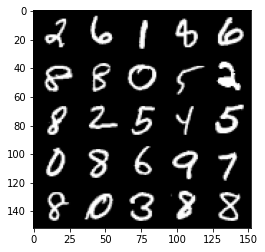

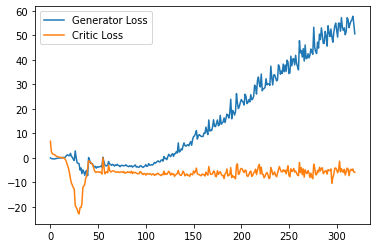

Step 6450: Generator loss: 55.46567550659179, critic loss: -5.544797326207163


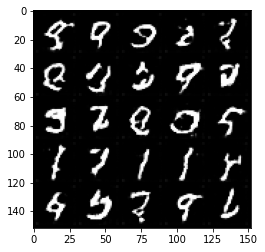

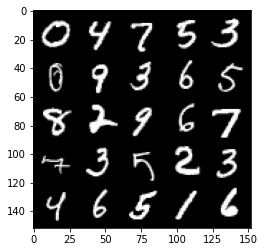

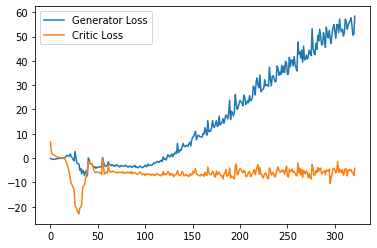

Step 6500: Generator loss: 56.29906730651855, critic loss: -5.242769397854805


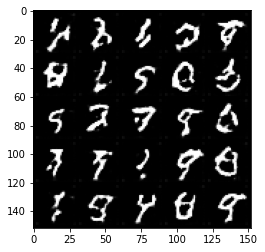

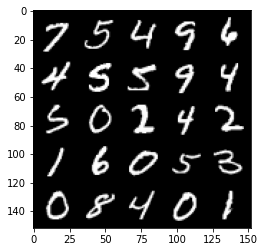

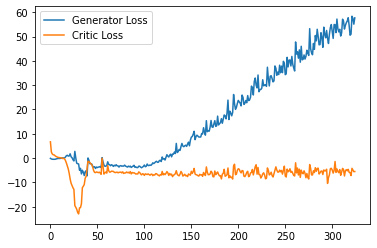

Step 6550: Generator loss: 56.523447799682614, critic loss: -6.7343404866457


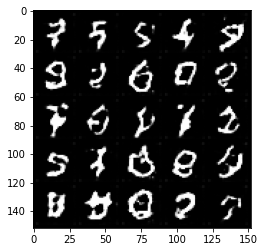

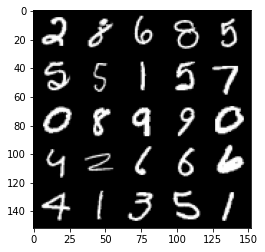

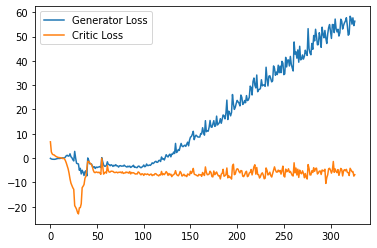

  0%|          | 0/469 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [11]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
